In [1]:
#note -> next iteration drop all nans
#basic imports
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings 
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('Loan_Default.csv',index_col=0)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 148670 entries, 24890 to 173559
Data columns (total 33 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   year                       148670 non-null  int64  
 1   loan_limit                 145326 non-null  object 
 2   Gender                     148670 non-null  object 
 3   approv_in_adv              147762 non-null  object 
 4   loan_type                  148670 non-null  object 
 5   loan_purpose               148536 non-null  object 
 6   Credit_Worthiness          148670 non-null  object 
 7   open_credit                148670 non-null  object 
 8   business_or_commercial     148670 non-null  object 
 9   loan_amount                148670 non-null  int64  
 10  rate_of_interest           112231 non-null  float64
 11  Interest_rate_spread       112031 non-null  float64
 12  Upfront_charges            109028 non-null  float64
 13  term                       148

In [4]:
df.head()

,year,loan_limit,Gender,approv_in_adv,loan_type,loan_purpose,Credit_Worthiness,open_credit,business_or_commercial,loan_amount,...,credit_type,Credit_Score,co-applicant_credit_type,age,submission_of_application,LTV,Region,Security_Type,Status,dtir1
ID,,,,,,,,,,,,,,,,,,,,,
24890,2019,cf,Sex Not Available,nopre,type1,p1,l1,nopc,nob/c,116500,...,EXP,758,CIB,25-34,to_inst,98.728814,south,direct,1,45.0
24891,2019,cf,Male,nopre,type2,p1,l1,nopc,b/c,206500,...,EQUI,552,EXP,55-64,to_inst,NaN,North,direct,1,NaN
24892,2019,cf,Male,pre,type1,p1,l1,nopc,nob/c,406500,...,EXP,834,CIB,35-44,to_inst,80.019685,south,direct,0,46.0
24893,2019,cf,Male,nopre,type1,p4,l1,nopc,nob/c,456500,...,EXP,587,CIB,45-54,not_inst,69.376900,North,direct,0,42.0
24894,2019,cf,Joint,pre,type1,p1,l1,nopc,nob/c,696500,...,CRIF,602,EXP,25-34,not_inst,91.886544,North,direct,0,39.0


In [5]:
df.select_dtypes(include='number').describe()

,year,loan_amount,rate_of_interest,Interest_rate_spread,Upfront_charges,term,property_value,income,Credit_Score,LTV,Status,dtir1
count,148670.0,1.486700e+05,112231.000000,112031.000000,109028.000000,148629.000000,1.335720e+05,139520.000000,148670.000000,133572.000000,148670.000000,124549.000000
mean,2019.0,3.311177e+05,4.045476,0.441656,3224.996127,335.136582,4.978935e+05,6957.338876,699.789103,72.746457,0.246445,37.732932
std,0.0,1.839093e+05,0.561391,0.513043,3251.121510,58.409084,3.599353e+05,6496.586382,115.875857,39.967603,0.430942,10.545435
min,2019.0,1.650000e+04,0.000000,-3.638000,0.000000,96.000000,8.000000e+03,0.000000,500.000000,0.967478,0.000000,5.000000
25%,2019.0,1.965000e+05,3.625000,0.076000,581.490000,360.000000,2.680000e+05,3720.000000,599.000000,60.474860,0.000000,31.000000
50%,2019.0,2.965000e+05,3.990000,0.390400,2596.450000,360.000000,4.180000e+05,5760.000000,699.000000,75.135870,0.000000,39.000000
75%,2019.0,4.365000e+05,4.375000,0.775400,4812.500000,360.000000,6.280000e+05,8520.000000,800.000000,86.184211,0.000000,45.000000
max,2019.0,3.576500e+06,8.000000,3.357000,60000.000000,360.000000,1.650800e+07,578580.000000,900.000000,7831.250000,1.000000,61.000000


In [6]:
from ydata_profiling import ProfileReport
report = ProfileReport(df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 148670 entries, 24890 to 173559
Data columns (total 33 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   year                       148670 non-null  int64  
 1   loan_limit                 145326 non-null  object 
 2   Gender                     148670 non-null  object 
 3   approv_in_adv              147762 non-null  object 
 4   loan_type                  148670 non-null  object 
 5   loan_purpose               148536 non-null  object 
 6   Credit_Worthiness          148670 non-null  object 
 7   open_credit                148670 non-null  object 
 8   business_or_commercial     148670 non-null  object 
 9   loan_amount                148670 non-null  int64  
 10  rate_of_interest           112231 non-null  float64
 11  Interest_rate_spread       112031 non-null  float64
 12  Upfront_charges            109028 non-null  float64
 13  term                       148

## Exploring columns one by one

In [8]:
(df.isna().sum().sort_values(ascending=False)*100)/len(df)

Upfront_charges              26.664425
Interest_rate_spread         24.644515
rate_of_interest             24.509989
dtir1                        16.224524
LTV                          10.155378
property_value               10.155378
income                        6.154571
loan_limit                    2.249277
approv_in_adv                 0.610749
submission_of_application     0.134526
age                           0.134526
loan_purpose                  0.090133
Neg_ammortization             0.081388
term                          0.027578
credit_type                   0.000000
Credit_Score                  0.000000
Security_Type                 0.000000
co-applicant_credit_type      0.000000
total_units                   0.000000
Region                        0.000000
Status                        0.000000
year                          0.000000
Secured_by                    0.000000
occupancy_type                0.000000
construction_type             0.000000
interest_only            

In [9]:
#year column only has one value, dropping it
df.drop('year',axis=1,inplace=True)

In [10]:
#upfornt charges
df['Upfront_charges'].describe()

count    109028.000000
mean       3224.996127
std        3251.121510
min           0.000000
25%         581.490000
50%        2596.450000
75%        4812.500000
max       60000.000000
Name: Upfront_charges, dtype: float64

In [11]:
#no correlation with any column
df.select_dtypes(include='number').corr()['Upfront_charges'].sort_values()

rate_of_interest       -0.076473
term                   -0.054960
LTV                    -0.031347
Status                 -0.019138
Credit_Score           -0.001484
dtir1                   0.000115
income                  0.016580
Interest_rate_spread    0.033037
property_value          0.053043
loan_amount             0.065556
Upfront_charges         1.000000
Name: Upfront_charges, dtype: float64

In [12]:
df.groupby('open_credit')['Upfront_charges'].describe()

,count,mean,std,min,25%,50%,75%,max
open_credit,,,,,,,,
nopc,109028.0,3224.996127,3251.12151,0.0,581.49,2596.45,4812.5,60000.0
opc,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
df.groupby('construction_type')['Upfront_charges'].describe()

,count,mean,std,min,25%,50%,75%,max
construction_type,,,,,,,,
mh,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
sb,109028.0,3224.996127,3251.12151,0.0,581.49,2596.45,4812.5,60000.0


In [14]:
df.groupby('Secured_by')['Upfront_charges'].describe()

,count,mean,std,min,25%,50%,75%,max
Secured_by,,,,,,,,
home,109028.0,3224.996127,3251.12151,0.0,581.49,2596.45,4812.5,60000.0
land,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
df.groupby('Status')['Upfront_charges'].describe()

,count,mean,std,min,25%,50%,75%,max
Status,,,,,,,,
0,108875.0,3227.328554,3251.673989,0.0,584.39,2600.00,4815.315,60000.0
1,153.0,1565.237974,2299.820513,0.0,0.00,687.85,2310.750,15584.0


In [16]:
#Upfront charge has clear distinction only being zero for specific categories
#filling it with 0
df['Upfront_charges'].fillna(0,inplace=True)
df['Upfront_tf'] = df['Upfront_charges'].apply(lambda x : x>0)

In [17]:
df['Upfront_tf'].value_counts()

Upfront_tf
True     88258
False    60412
Name: count, dtype: int64

In [18]:
((df.isna().sum().sort_values(ascending=False)*100)/len(df)).head(14)

Interest_rate_spread         24.644515
rate_of_interest             24.509989
dtir1                        16.224524
property_value               10.155378
LTV                          10.155378
income                        6.154571
loan_limit                    2.249277
approv_in_adv                 0.610749
submission_of_application     0.134526
age                           0.134526
loan_purpose                  0.090133
Neg_ammortization             0.081388
term                          0.027578
business_or_commercial        0.000000
dtype: float64

In [19]:
df['Interest_rate_spread'].describe()

count    112031.000000
mean          0.441656
std           0.513043
min          -3.638000
25%           0.076000
50%           0.390400
75%           0.775400
max           3.357000
Name: Interest_rate_spread, dtype: float64

In [20]:
df.groupby('Status')['rate_of_interest'].describe()

,count,mean,std,min,25%,50%,75%,max
Status,,,,,,,,
0,112031.0,4.044931,0.561356,0.000,3.625,3.9900,4.375,8.0
1,200.0,4.350500,0.495546,3.125,3.990,4.3125,4.750,5.5


In [21]:
df['Interest_rate_spread_missing'] = df['Interest_rate_spread'].apply(lambda x : pd.isna(x))

In [22]:
df['Interest_rate_spread_missing'].value_counts()

Interest_rate_spread_missing
False    112031
True      36639
Name: count, dtype: int64

In [23]:
df.select_dtypes(include='number').corr()['Interest_rate_spread'].sort_values()

loan_amount            -0.377272
property_value         -0.334571
term                   -0.157139
income                 -0.151333
Credit_Score           -0.001738
Upfront_charges         0.026113
LTV                     0.040257
dtir1                   0.078178
rate_of_interest        0.614908
Interest_rate_spread    1.000000
Status                       NaN
Name: Interest_rate_spread, dtype: float64

In [24]:
df['rate_of_interest'].describe()

count    112231.000000
mean          4.045476
std           0.561391
min           0.000000
25%           3.625000
50%           3.990000
75%           4.375000
max           8.000000
Name: rate_of_interest, dtype: float64

In [25]:
df['rate_of_interest_missing'] = df['rate_of_interest'].apply(lambda x : pd.isna(x))

In [26]:
df['rate_of_interest_missing'].value_counts()

rate_of_interest_missing
False    112231
True      36439
Name: count, dtype: int64

In [27]:
df.groupby('interest_only')['rate_of_interest'].describe()

,count,mean,std,min,25%,50%,75%,max
interest_only,,,,,,,,
int_only,5168.0,4.022069,0.722830,2.25,3.500,3.875,4.25,6.75
not_int,107063.0,4.046606,0.552385,0.00,3.625,3.990,4.49,8.00


In [28]:
df.groupby('interest_only')['Interest_rate_spread'].describe()

,count,mean,std,min,25%,50%,75%,max
interest_only,,,,,,,,
int_only,5168.0,0.454957,0.532658,-0.9658,0.039875,0.3853,0.83065,2.182
not_int,106863.0,0.441012,0.512069,-3.6380,0.077300,0.3906,0.77300,3.357


In [29]:
df['rate_of_interest'].fillna(0,inplace=True)
df['Interest_rate_spread'].fillna(0,inplace=True)

In [30]:
((df.isna().sum().sort_values(ascending=False)*100)/len(df)).head(14)

dtir1                           16.224524
LTV                             10.155378
property_value                  10.155378
income                           6.154571
loan_limit                       2.249277
approv_in_adv                    0.610749
submission_of_application        0.134526
age                              0.134526
loan_purpose                     0.090133
Neg_ammortization                0.081388
term                             0.027578
Upfront_tf                       0.000000
Interest_rate_spread_missing     0.000000
Status                           0.000000
dtype: float64

In [31]:
df['dtir1'].describe()

count    124549.000000
mean         37.732932
std          10.545435
min           5.000000
25%          31.000000
50%          39.000000
75%          45.000000
max          61.000000
Name: dtir1, dtype: float64

In [32]:
df.groupby('Status')['dtir1'].describe()

,count,mean,std,min,25%,50%,75%,max
Status,,,,,,,,
0,104220.0,37.369267,10.027197,5.0,31.0,38.0,44.0,61.0
1,20329.0,39.597324,12.716828,5.0,32.0,42.0,49.0,61.0


In [33]:
df.select_dtypes(include='number').corr()['Status'].sort_values()

rate_of_interest       -0.958875
Upfront_charges        -0.431183
Interest_rate_spread   -0.392977
income                 -0.065119
property_value         -0.048864
loan_amount            -0.036825
term                   -0.000240
Credit_Score            0.004004
LTV                     0.038895
dtir1                   0.078083
Status                  1.000000
Name: Status, dtype: float64

In [34]:
#dtir1 is identical for both target classes
df.drop('dtir1',inplace=True,axis=1)

In [35]:
((df.isna().sum().sort_values(ascending=False)*100)/len(df)).head(11)

LTV                             10.155378
property_value                  10.155378
income                           6.154571
loan_limit                       2.249277
approv_in_adv                    0.610749
submission_of_application        0.134526
age                              0.134526
loan_purpose                     0.090133
Neg_ammortization                0.081388
term                             0.027578
Interest_rate_spread_missing     0.000000
dtype: float64

In [36]:
df['LTV'].describe()

count    133572.000000
mean         72.746457
std          39.967603
min           0.967478
25%          60.474860
50%          75.135870
75%          86.184211
max        7831.250000
Name: LTV, dtype: float64

In [37]:
df.groupby('Status')['LTV'].describe()

,count,mean,std,min,25%,50%,75%,max
Status,,,,,,,,
0,112029.0,72.064757,41.768899,2.072943,59.970817,74.504405,85.201149,7831.25
1,21543.0,76.291468,28.580217,0.967478,64.273172,79.362416,90.948276,2956.25


In [38]:
ind_ltv = df['LTV'].sort_values(ascending=False).head(10).index
df.drop(ind_ltv,inplace=True)

In [39]:
ltv_mean = df['LTV'].mean()
df.fillna({'LTV':ltv_mean},inplace=True)

In [40]:
df.groupby('Status')['property_value'].describe()

,count,mean,std,min,25%,50%,75%,max
Status,,,,,,,,
0,112023.0,505630.575864,342776.656713,28000.0,288000.0,428000.0,638000.0,9268000.0
1,21539.0,457865.824783,436256.174642,18000.0,228000.0,348000.0,558000.0,16508000.0


In [41]:
df.fillna({'property_value':df['property_value'].mean()},inplace=True)

In [42]:
((df.isna().sum().sort_values(ascending=False)*100)/len(df)).head(11)

income                       6.150276
loan_limit                   2.249428
approv_in_adv                0.610790
age                          0.134535
submission_of_application    0.134535
loan_purpose                 0.090139
Neg_ammortization            0.081394
term                         0.027580
credit_type                  0.000000
Credit_Score                 0.000000
co-applicant_credit_type     0.000000
dtype: float64

In [43]:
df.groupby('Status')['income'].describe()

,count,mean,std,min,25%,50%,75%,max
Status,,,,,,,,
0,104120.0,7204.014214,6201.339600,0.0,4020.0,6000.0,8760.0,377220.0
1,35397.0,6232.136622,7247.865117,0.0,3000.0,4860.0,7620.0,578580.0


In [44]:
df.select_dtypes(include='number').corr()['income']

loan_amount             0.456056
rate_of_interest        0.054122
Interest_rate_spread   -0.083439
Upfront_charges         0.039758
term                   -0.053797
property_value          0.392632
income                  1.000000
Credit_Score            0.000808
LTV                    -0.062970
Status                 -0.065095
Name: income, dtype: float64

In [45]:
df.fillna({'income':df['income'].mean()},inplace=True)

In [46]:
((df.isna().sum().sort_values(ascending=False)*100)/len(df)).head(8)

loan_limit                   2.249428
approv_in_adv                0.610790
age                          0.134535
submission_of_application    0.134535
loan_purpose                 0.090139
Neg_ammortization            0.081394
term                         0.027580
income                       0.000000
dtype: float64

In [47]:
df['loan_limit'].fillna('cf',inplace=True)

In [48]:
df['approv_in_adv'].fillna('nopre',inplace=True)

In [49]:
df['submission_of_application'].fillna('to_inst',inplace=True)

In [50]:
df['loan_purpose'].fillna('p3',inplace=True)

In [51]:
df['age'].fillna(0,inplace=True)

In [52]:
df['Neg_ammortization'] = df['Neg_ammortization'].fillna('not_neg')

In [53]:
df['term'].fillna(360.0,inplace=True)

In [54]:
((df.isna().sum().sort_values(ascending=False)*100)/len(df)).head(8)

loan_limit                  0.0
age                         0.0
Secured_by                  0.0
total_units                 0.0
income                      0.0
credit_type                 0.0
Credit_Score                0.0
co-applicant_credit_type    0.0
dtype: float64

In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 148660 entries, 24890 to 173559
Data columns (total 34 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   loan_limit                    148660 non-null  object 
 1   Gender                        148660 non-null  object 
 2   approv_in_adv                 148660 non-null  object 
 3   loan_type                     148660 non-null  object 
 4   loan_purpose                  148660 non-null  object 
 5   Credit_Worthiness             148660 non-null  object 
 6   open_credit                   148660 non-null  object 
 7   business_or_commercial        148660 non-null  object 
 8   loan_amount                   148660 non-null  int64  
 9   rate_of_interest              148660 non-null  float64
 10  Interest_rate_spread          148660 non-null  float64
 11  Upfront_charges               148660 non-null  float64
 12  term                          148660 non-null

In [56]:
cat_cols = ['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose','Credit_Worthiness', 'open_credit', 'business_or_commercial','Neg_ammortization', 'interest_only',
       'lump_sum_payment','construction_type','occupancy_type', 'Secured_by', 'total_units','credit_type','co-applicant_credit_type','submission_of_application','age','Region', 'Security_Type','Upfront_tf', 'Interest_rate_spread_missing',
       'rate_of_interest_missing']
num_cols = ['loan_amount', 'rate_of_interest', 'Interest_rate_spread','Upfront_charges', 'term','property_value','income','Credit_Score','LTV']
target_col = ['Status']

In [57]:
def plot_box(df):
    numerical_cols = ['loan_amount', 'rate_of_interest', 'Interest_rate_spread','Upfront_charges', 'term','property_value','income','Credit_Score','LTV']
    num_plots = len(numerical_cols)
    nrows = (num_plots+1)//2
    ncols = 2
    fig, axes = plt.subplots(figsize=(20,40),nrows=nrows,ncols=ncols,facecolor='black')
    for i,column in enumerate(numerical_cols):
        row = i//2
        col = i%2
        ax = axes[row,col]
        ax.set_facecolor('black')
        sns.boxplot(x='Status',y=column,data=df,palette='rocket', linewidth=2.5, saturation=0.9,ax=ax,width=0.55)
        ax.set_title(f'Boxplot of {column}', color='white', fontsize=14, weight='bold')
        ax.set_xlabel(f'{column}', color='white', fontsize=12)
        ax.set_ylabel('Values', color='white', fontsize=12)
        
        ax.tick_params(axis='x', colors='white', labelsize=10)
        ax.tick_params(axis='y', colors='white', labelsize=10)
        
        for spine in ax.spines.values():
            spine.set_edgecolor('white')
        
        # Handle legend if present
        legend = ax.get_legend()
        if legend is not None:
            legend.get_frame().set_facecolor('black')
            legend.get_frame().set_edgecolor('white')
            plt.setp(legend.get_texts(), color='white')
    plt.tight_layout()
    plt.show()

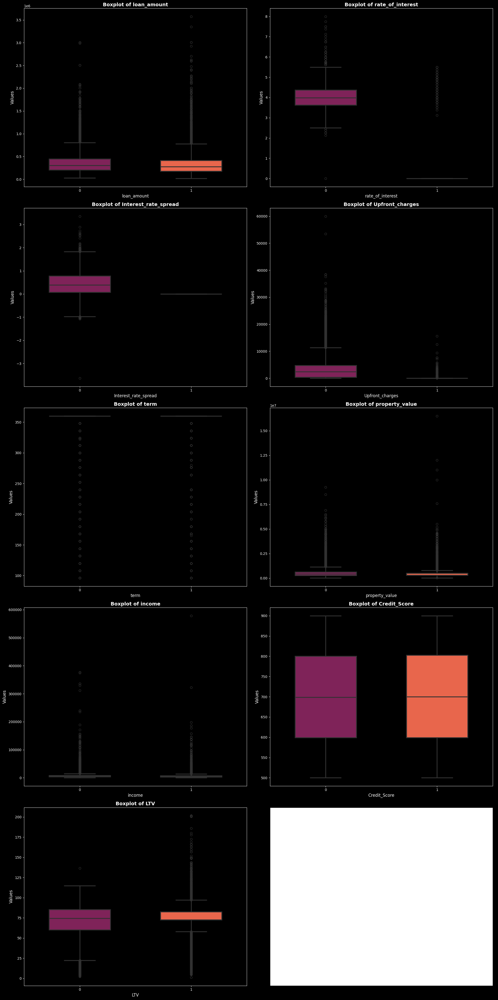

In [58]:
plot_box(df)

In [59]:
def plot_hist(df):
    numerical_cols = ['loan_amount', 'rate_of_interest', 'Interest_rate_spread','Upfront_charges', 'term','property_value','income','Credit_Score','LTV']
    num_plots = len(numerical_cols)
    nrows = (num_plots+1)//2
    ncols = 2
    fig, axes = plt.subplots(figsize=(20,40),nrows=nrows,ncols=ncols,facecolor='black')
    for i,column in enumerate(numerical_cols):
        row = i//2
        col = i%2
        ax = axes[row,col]
        ax.set_facecolor('black')
        sns.histplot(x=column,data=df,palette='winter',ax=ax,kde=True,bins=70)
        ax.set_title(f'histplot of {column}', color='white', fontsize=14, weight='bold')
        ax.set_xlabel(f'{column}', color='white', fontsize=12)
        ax.set_ylabel('Values', color='white', fontsize=12)
        
        ax.tick_params(axis='x', colors='white', labelsize=10)
        ax.tick_params(axis='y', colors='white', labelsize=10)
        
        for spine in ax.spines.values():
            spine.set_edgecolor('white')
        
        # Handle legend if present
        legend = ax.get_legend()
        if legend is not None:
            legend.get_frame().set_facecolor('black')
            legend.get_frame().set_edgecolor('white')
            plt.setp(legend.get_texts(), color='white')
    plt.tight_layout()
    plt.show()

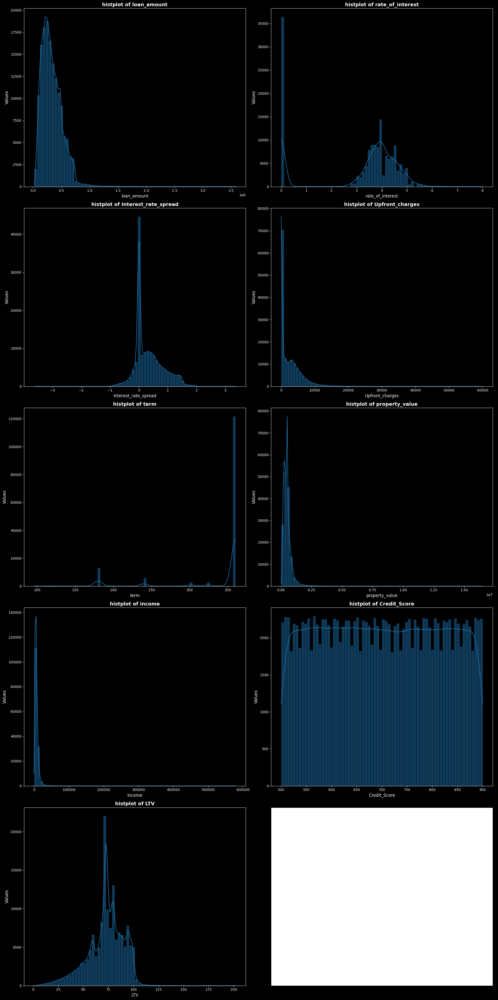

In [60]:
plot_hist(df)

In [61]:
def plot_count(df):
    cat_cols = ['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose','Credit_Worthiness', 'open_credit', 'business_or_commercial','Neg_ammortization', 'interest_only',
       'lump_sum_payment','construction_type','occupancy_type', 'Secured_by', 'total_units','credit_type','co-applicant_credit_type','submission_of_application','age','Region', 'Security_Type','Upfront_tf', 'Interest_rate_spread_missing',
       'rate_of_interest_missing']
    num_plots = len(cat_cols)
    nrows = (num_plots+1)//3
    ncols = 3
    fig, axes = plt.subplots(figsize=(30,50),nrows=nrows,ncols=ncols,facecolor='black')
    for i,column in enumerate(cat_cols):
        row = i//3
        col = i%3
        ax = axes[row,col]
        ax.set_facecolor('black')
        sns.countplot(x=df[column],palette='Set3',ax=ax)
        ax.set_title(f'Distplot of {column}', color='white', fontsize=14, weight='bold')
        ax.set_xlabel(f'{column}', color='white', fontsize=12)
        ax.set_ylabel('Values', color='white', fontsize=12)
        
        ax.tick_params(axis='x', colors='white', labelsize=10)
        ax.tick_params(axis='y', colors='white', labelsize=10)
        
        for spine in ax.spines.values():
            spine.set_edgecolor('white')
        
        # Handle legend if present
        legend = ax.get_legend()
        if legend is not None:
            legend.get_frame().set_facecolor('black')
            legend.get_frame().set_edgecolor('white')
            plt.setp(legend.get_texts(), color='white')
    plt.tight_layout()
    plt.show()

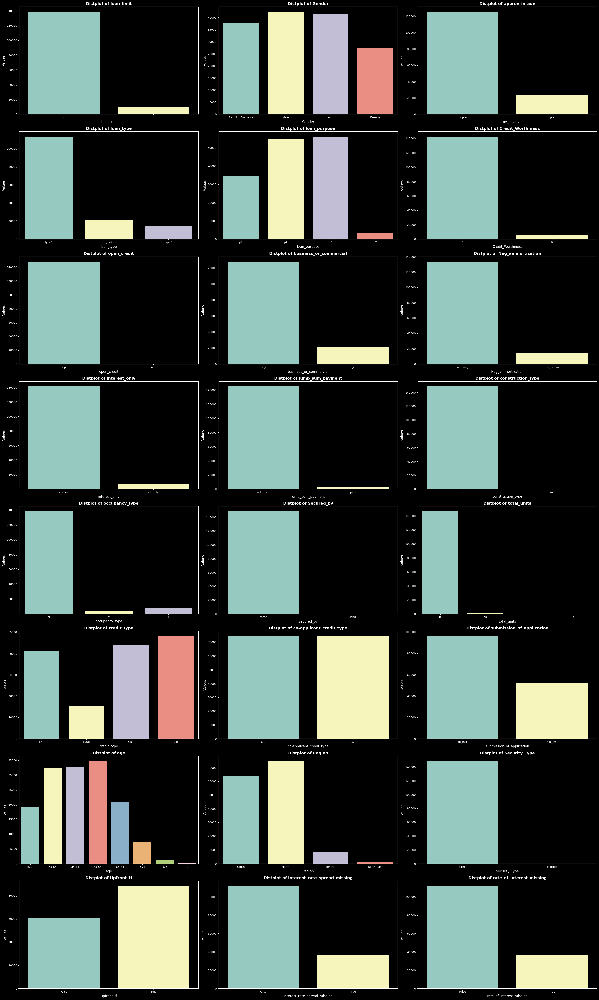

In [62]:
plot_count(df)

In [63]:
#one hot encoding for bianry
bin_cols =  ['loan_limit', 'Gender', 'approv_in_adv', 'loan_type', 'loan_purpose','Credit_Worthiness', 'open_credit', 'business_or_commercial','Neg_ammortization', 'interest_only',
       'lump_sum_payment','construction_type','occupancy_type', 'Secured_by', 'total_units','credit_type','co-applicant_credit_type','submission_of_application','Region', 'Security_Type',]
df_dum = pd.get_dummies(df[bin_cols],drop_first=True)

In [64]:
df = df.drop(bin_cols,axis=1).join(df_dum)

In [65]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 148660 entries, 24890 to 173559
Data columns (total 46 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   loan_amount                        148660 non-null  int64  
 1   rate_of_interest                   148660 non-null  float64
 2   Interest_rate_spread               148660 non-null  float64
 3   Upfront_charges                    148660 non-null  float64
 4   term                               148660 non-null  float64
 5   property_value                     148660 non-null  float64
 6   income                             148660 non-null  float64
 7   Credit_Score                       148660 non-null  int64  
 8   age                                148660 non-null  object 
 9   LTV                                148660 non-null  float64
 10  Status                             148660 non-null  int64  
 11  Upfront_tf                         14866

In [66]:
df['age'] = df['age'].map({'45-54':50,'35-44':40,'55-64':60,'65-74':70,'25-34':30,'<25':25,'>74':74,'0':0})

In [67]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
loan_amount,148660.0,331118.592762,183908.236124,16500.000000,196500.000000,296500.000000,436500.000000,3.576500e+06
rate_of_interest,148660.0,3.053987,1.807207,0.000000,2.750000,3.750000,4.250000,8.000000e+00
Interest_rate_spread,148660.0,0.332799,0.484321,-3.638000,0.000000,0.188000,0.620000,3.357000e+00
Upfront_charges,148660.0,2365.228560,3128.175195,0.000000,0.000000,1140.000000,3890.000000,6.000000e+04
term,148660.0,335.142977,58.402746,96.000000,360.000000,360.000000,360.000000,3.600000e+02
property_value,148660.0,497927.748911,341159.922590,18000.000000,288000.000000,458000.000000,598000.000000,1.650800e+07
income,148660.0,6957.438162,6293.668582,0.000000,3840.000000,6000.000000,8280.000000,5.785800e+05
Credit_Score,148660.0,699.789049,115.876623,500.000000,599.000000,699.000000,800.000000,9.000000e+02
age,148460.0,51.131315,13.552279,25.000000,40.000000,50.000000,60.000000,7.400000e+01
LTV,148660.0,72.522075,17.934002,0.967478,63.297872,73.026316,84.722222,2.017857e+02


In [68]:
df['loan_amount'] = df['loan_amount'].astype('int32')
df['rate_of_interest'] = df['rate_of_interest'].astype('float16')
df['Interest_rate_spread'] = df['Interest_rate_spread'].astype('float16')
df['Upfront_charges'] = df['Upfront_charges'].astype('float16')
df['term'] = df['term'].astype('float16')
df['property_value'] = df['property_value'].astype('float32')
df['income'] = df['income'].astype('float32')
df['Credit_Score'] = df['Credit_Score'].astype('int16')
df['age'] = df['age'].astype('float16')
df['LTV'] = df['LTV'].astype('int8')
df['Status'] = df['Status'].astype('int8')

In [69]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 148660 entries, 24890 to 173559
Data columns (total 46 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   loan_amount                        148660 non-null  int32  
 1   rate_of_interest                   148660 non-null  float16
 2   Interest_rate_spread               148660 non-null  float16
 3   Upfront_charges                    148660 non-null  float16
 4   term                               148660 non-null  float16
 5   property_value                     148660 non-null  float32
 6   income                             148660 non-null  float32
 7   Credit_Score                       148660 non-null  int16  
 8   age                                148460 non-null  float16
 9   LTV                                148660 non-null  int8   
 10  Status                             148660 non-null  int8   
 11  Upfront_tf                         14866

In [70]:
#observed overfiiting due to these columns hence removed
df.drop(['Interest_rate_spread','Interest_rate_spread_missing','rate_of_interest_missing','credit_type_EQUI','rate_of_interest'],axis=1,inplace=True)

In [71]:
X = df.drop('Status',axis=1)
y = df['Status']

In [72]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.33)

In [73]:
from sklearn.preprocessing import StandardScaler
sclr = StandardScaler()
X_train = sclr.fit_transform(X_train)
X_test = sclr.transform(X_test)

In [74]:
#base model check
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)
pred_dtree = dtree.predict(X_test)
print(classification_report(y_test,pred_dtree))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94     36962
           1       0.82      0.82      0.82     12096

    accuracy                           0.91     49058
   macro avg       0.88      0.88      0.88     49058
weighted avg       0.91      0.91      0.91     49058



# Baseline models for feature selection

## Catboost

In [75]:
from catboost import CatBoostClassifier
model = CatBoostClassifier()
model.fit(X_train,y_train,plot=True)
pred_cat = model.predict(X_test)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.073484
0:	learn: 0.5146614	total: 67.2ms	remaining: 1m 7s
1:	learn: 0.3963984	total: 74.2ms	remaining: 37s
2:	learn: 0.3239574	total: 81.3ms	remaining: 27s
3:	learn: 0.2810143	total: 87.2ms	remaining: 21.7s
4:	learn: 0.2490595	total: 92.9ms	remaining: 18.5s
5:	learn: 0.2267177	total: 98.9ms	remaining: 16.4s
6:	learn: 0.2126853	total: 105ms	remaining: 14.9s
7:	learn: 0.2035969	total: 110ms	remaining: 13.7s
8:	learn: 0.1955865	total: 117ms	remaining: 12.8s
9:	learn: 0.1883593	total: 122ms	remaining: 12.1s
10:	learn: 0.1829741	total: 128ms	remaining: 11.5s
11:	learn: 0.1784066	total: 134ms	remaining: 11s
12:	learn: 0.1757834	total: 140ms	remaining: 10.6s
13:	learn: 0.1728445	total: 146ms	remaining: 10.3s
14:	learn: 0.1705752	total: 151ms	remaining: 9.91s
15:	learn: 0.1685032	total: 156ms	remaining: 9.6s
16:	learn: 0.1668464	total: 162ms	remaining: 9.34s
17:	learn: 0.1631290	total: 167ms	remaining: 9.13s
18:	learn: 0.1617962	total: 173ms	remaining: 8.93s
19:	learn: 0

164:	learn: 0.1292864	total: 1s	remaining: 5.06s
165:	learn: 0.1292254	total: 1s	remaining: 5.05s
166:	learn: 0.1291932	total: 1.01s	remaining: 5.04s
167:	learn: 0.1291638	total: 1.01s	remaining: 5.03s
168:	learn: 0.1290383	total: 1.02s	remaining: 5.02s
169:	learn: 0.1289469	total: 1.02s	remaining: 5.01s
170:	learn: 0.1289219	total: 1.03s	remaining: 5s
171:	learn: 0.1288659	total: 1.03s	remaining: 4.99s
172:	learn: 0.1288136	total: 1.04s	remaining: 4.98s
173:	learn: 0.1287582	total: 1.05s	remaining: 4.96s
174:	learn: 0.1287161	total: 1.05s	remaining: 4.96s
175:	learn: 0.1286817	total: 1.06s	remaining: 4.95s
176:	learn: 0.1285988	total: 1.06s	remaining: 4.94s
177:	learn: 0.1285504	total: 1.07s	remaining: 4.93s
178:	learn: 0.1285111	total: 1.07s	remaining: 4.92s
179:	learn: 0.1284575	total: 1.08s	remaining: 4.91s
180:	learn: 0.1284068	total: 1.08s	remaining: 4.9s
181:	learn: 0.1283569	total: 1.09s	remaining: 4.89s
182:	learn: 0.1282825	total: 1.09s	remaining: 4.88s
183:	learn: 0.1282505	

332:	learn: 0.1217218	total: 1.93s	remaining: 3.86s
333:	learn: 0.1217018	total: 1.93s	remaining: 3.85s
334:	learn: 0.1216603	total: 1.94s	remaining: 3.84s
335:	learn: 0.1216286	total: 1.94s	remaining: 3.84s
336:	learn: 0.1216083	total: 1.95s	remaining: 3.83s
337:	learn: 0.1215781	total: 1.95s	remaining: 3.82s
338:	learn: 0.1215462	total: 1.96s	remaining: 3.82s
339:	learn: 0.1215045	total: 1.96s	remaining: 3.81s
340:	learn: 0.1214777	total: 1.97s	remaining: 3.8s
341:	learn: 0.1214528	total: 1.97s	remaining: 3.8s
342:	learn: 0.1214065	total: 1.98s	remaining: 3.79s
343:	learn: 0.1213672	total: 1.98s	remaining: 3.79s
344:	learn: 0.1213359	total: 1.99s	remaining: 3.78s
345:	learn: 0.1213191	total: 2s	remaining: 3.77s
346:	learn: 0.1212931	total: 2s	remaining: 3.77s
347:	learn: 0.1212502	total: 2.01s	remaining: 3.76s
348:	learn: 0.1212062	total: 2.01s	remaining: 3.75s
349:	learn: 0.1211657	total: 2.02s	remaining: 3.75s
350:	learn: 0.1211138	total: 2.02s	remaining: 3.74s
351:	learn: 0.121073

499:	learn: 0.1166471	total: 2.82s	remaining: 2.82s
500:	learn: 0.1166169	total: 2.82s	remaining: 2.81s
501:	learn: 0.1165882	total: 2.83s	remaining: 2.81s
502:	learn: 0.1165706	total: 2.83s	remaining: 2.8s
503:	learn: 0.1165520	total: 2.84s	remaining: 2.79s
504:	learn: 0.1165351	total: 2.85s	remaining: 2.79s
505:	learn: 0.1165067	total: 2.85s	remaining: 2.78s
506:	learn: 0.1164752	total: 2.86s	remaining: 2.78s
507:	learn: 0.1164614	total: 2.87s	remaining: 2.77s
508:	learn: 0.1164379	total: 2.87s	remaining: 2.77s
509:	learn: 0.1164046	total: 2.88s	remaining: 2.77s
510:	learn: 0.1163714	total: 2.88s	remaining: 2.76s
511:	learn: 0.1163411	total: 2.89s	remaining: 2.75s
512:	learn: 0.1163145	total: 2.9s	remaining: 2.75s
513:	learn: 0.1162888	total: 2.91s	remaining: 2.75s
514:	learn: 0.1162715	total: 2.92s	remaining: 2.75s
515:	learn: 0.1162613	total: 2.93s	remaining: 2.75s
516:	learn: 0.1162445	total: 2.93s	remaining: 2.74s
517:	learn: 0.1162090	total: 2.94s	remaining: 2.73s
518:	learn: 0.

670:	learn: 0.1126458	total: 3.75s	remaining: 1.84s
671:	learn: 0.1126049	total: 3.75s	remaining: 1.83s
672:	learn: 0.1125945	total: 3.76s	remaining: 1.83s
673:	learn: 0.1125692	total: 3.76s	remaining: 1.82s
674:	learn: 0.1125617	total: 3.77s	remaining: 1.81s
675:	learn: 0.1125506	total: 3.77s	remaining: 1.81s
676:	learn: 0.1125145	total: 3.78s	remaining: 1.8s
677:	learn: 0.1124959	total: 3.78s	remaining: 1.8s
678:	learn: 0.1124815	total: 3.79s	remaining: 1.79s
679:	learn: 0.1124643	total: 3.79s	remaining: 1.78s
680:	learn: 0.1124353	total: 3.8s	remaining: 1.78s
681:	learn: 0.1124210	total: 3.81s	remaining: 1.77s
682:	learn: 0.1124017	total: 3.81s	remaining: 1.77s
683:	learn: 0.1123831	total: 3.82s	remaining: 1.76s
684:	learn: 0.1123555	total: 3.82s	remaining: 1.76s
685:	learn: 0.1123462	total: 3.83s	remaining: 1.75s
686:	learn: 0.1123279	total: 3.83s	remaining: 1.75s
687:	learn: 0.1123082	total: 3.84s	remaining: 1.74s
688:	learn: 0.1122881	total: 3.84s	remaining: 1.73s
689:	learn: 0.1

840:	learn: 0.1092571	total: 4.64s	remaining: 877ms
841:	learn: 0.1092369	total: 4.64s	remaining: 871ms
842:	learn: 0.1092259	total: 4.65s	remaining: 865ms
843:	learn: 0.1092070	total: 4.65s	remaining: 860ms
844:	learn: 0.1092032	total: 4.66s	remaining: 854ms
845:	learn: 0.1091941	total: 4.66s	remaining: 849ms
846:	learn: 0.1091771	total: 4.67s	remaining: 843ms
847:	learn: 0.1091552	total: 4.67s	remaining: 838ms
848:	learn: 0.1091130	total: 4.68s	remaining: 832ms
849:	learn: 0.1090904	total: 4.68s	remaining: 826ms
850:	learn: 0.1090663	total: 4.69s	remaining: 821ms
851:	learn: 0.1090488	total: 4.69s	remaining: 815ms
852:	learn: 0.1090342	total: 4.7s	remaining: 810ms
853:	learn: 0.1090320	total: 4.7s	remaining: 804ms
854:	learn: 0.1090189	total: 4.71s	remaining: 798ms
855:	learn: 0.1090060	total: 4.71s	remaining: 793ms
856:	learn: 0.1089926	total: 4.72s	remaining: 787ms
857:	learn: 0.1089726	total: 4.72s	remaining: 782ms
858:	learn: 0.1089559	total: 4.73s	remaining: 776ms
859:	learn: 0.

In [76]:
print(classification_report(y_test,pred_cat))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96     36962
           1       0.89      0.88      0.89     12096

    accuracy                           0.94     49058
   macro avg       0.93      0.92      0.92     49058
weighted avg       0.94      0.94      0.94     49058



### XGBoost

In [77]:
from xgboost import XGBClassifier
xgb = XGBClassifier()
xgb.fit(X_train,y_train)
pred_xgb = xgb.predict(X_test)
print(classification_report(y_test,pred_xgb))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96     36962
           1       0.89      0.88      0.88     12096

    accuracy                           0.94     49058
   macro avg       0.92      0.92      0.92     49058
weighted avg       0.94      0.94      0.94     49058



### LGBM

In [78]:
from lightgbm import LGBMClassifier
lgbm = LGBMClassifier()
lgbm.fit(X_train,y_train)
pred_lgbm = lgbm.predict(X_test)
print(classification_report(y_test,pred_lgbm))

[LightGBM] [Info] Number of positive: 24539, number of negative: 75063
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005971 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1456
[LightGBM] [Info] Number of data points in the train set: 99602, number of used features: 40
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.246371 -> initscore=-1.118064
[LightGBM] [Info] Start training from score -1.118064
              precision    recall  f1-score   support

           0       0.96      0.96      0.96     36962
           1       0.88      0.89      0.89     12096

    accuracy                           0.94     49058
   macro avg       0.92      0.92      0.92     49058
weighted avg       0.94      0.94      0.94     49058



In [79]:
cat_imp = np.array(model.feature_importances_)
lgbm_imp = np.array(lgbm.feature_importances_)
xgb_imp = np.array(xgb.feature_importances_)

In [80]:
mean_imp = (cat_imp+lgbm_imp+xgb_imp)/3

In [81]:
mean_imp

array([8.23715160e+01, 3.49295241e+01, 2.67866593e+01, 1.19573166e+02,
       1.53197673e+02, 5.91702091e+01, 5.87793653e+01, 1.42197480e+02,
       1.39260510e+01, 8.78280368e+00, 5.11907814e+00, 8.06502446e+00,
       4.05643201e+00, 1.10736446e+01, 1.50572688e+01, 2.48589371e+01,
       4.34519397e+00, 2.51583501e+01, 1.82245676e+01, 1.54422796e+01,
       1.00349190e+01, 1.41651440e+00, 2.50056723e+01, 1.33788705e+01,
       2.98517636e+01, 6.33398005e+00, 2.51577719e+01, 4.34598159e+00,
       4.72234455e-04, 9.02218320e+00, 5.01089881e+00, 1.67046176e+00,
       3.37026702e+00, 7.75812100e+00, 1.58726468e+01, 2.85237239e+01,
       2.49015055e-03, 8.03039094e+00, 7.76279068e+00, 1.52297025e-03])

In [82]:
feature_df = pd.DataFrame(mean_imp,columns=['importance'],index=X.columns)

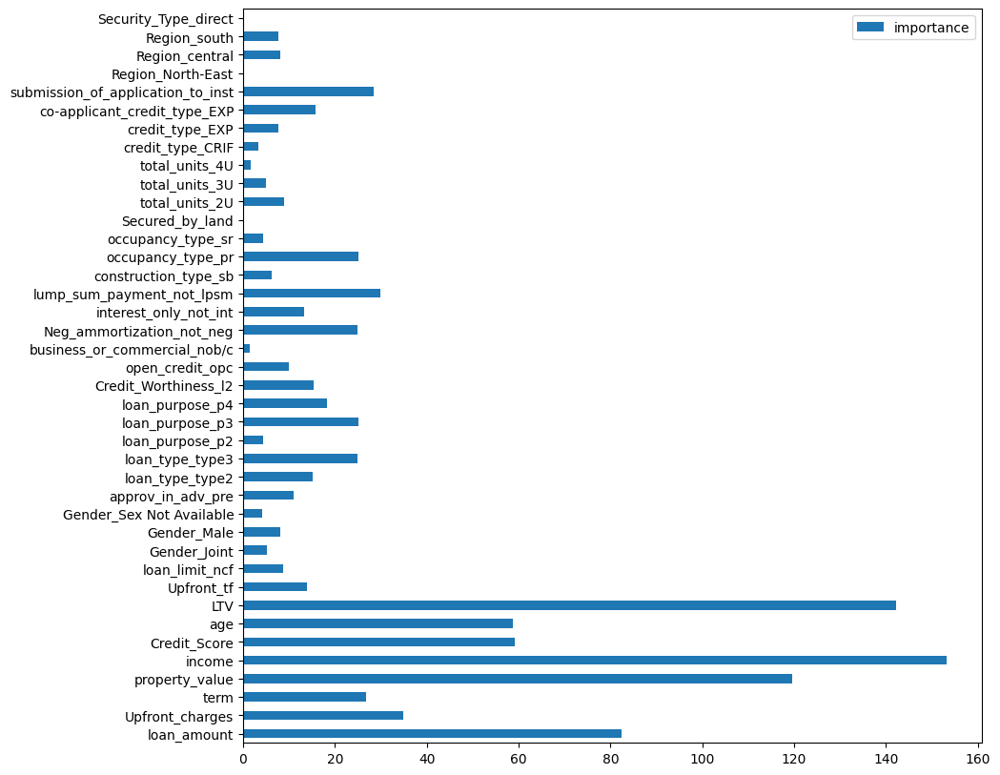

In [83]:
feature_df.plot(kind='barh',figsize=(10,10))
plt.show()

In [84]:
#removing average importance less than 10
low_imp_cols = feature_df.sort_values(by='importance',ascending=False).tail(18).index

In [85]:
df.drop(low_imp_cols,axis=1,inplace=True)

In [86]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 148660 entries, 24890 to 173559
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   loan_amount                        148660 non-null  int32  
 1   Upfront_charges                    148660 non-null  float16
 2   term                               148660 non-null  float16
 3   property_value                     148660 non-null  float32
 4   income                             148660 non-null  float32
 5   Credit_Score                       148660 non-null  int16  
 6   age                                148460 non-null  float16
 7   LTV                                148660 non-null  int8   
 8   Status                             148660 non-null  int8   
 9   Upfront_tf                         148660 non-null  bool   
 10  approv_in_adv_pre                  148660 non-null  bool   
 11  loan_type_type2                    14866

### iteration 2

In [87]:
df.fillna(1,inplace=True)

In [89]:
X = df.drop('Status',axis=1)
y = df['Status']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25,stratify=y)
sclr = StandardScaler()
X_train = sclr.fit_transform(X_train)
X_test = sclr.transform(X_test)

In [90]:
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)
pred_dtree = dtree.predict(X_test)
print(classification_report(y_test,pred_dtree))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94     28006
           1       0.83      0.83      0.83      9159

    accuracy                           0.91     37165
   macro avg       0.88      0.88      0.88     37165
weighted avg       0.91      0.91      0.91     37165



In [91]:
from sklearn.metrics import classification_report,accuracy_score,f1_score,roc_auc_score
def train_model(model,name,X_train=X_train,X_test=X_test,y_train=y_train,y_test=y_test):
    #fit model
    model.fit(X_train,y_train)
    pred = model.predict(X_test)
    #classification report
    print(name,"\n")
    print(classification_report(y_test,pred),"\n")
    #roc
    roc = roc_auc_score(y_test,pred)
    print(f"ROC_AUC_SCORE : {roc:.4f}","\n")
    #acc
    acc = accuracy_score(y_test,pred)
    print(f"ACCURACY : {acc:.4f}","\n")
    #f1 
    f1 = f1_score(y_test,pred)
    print(f"F1_SCORE: {f1:.4f}")

In [92]:
dtree = DecisionTreeClassifier()
train_model(dtree,"DTREE")

DTREE 

              precision    recall  f1-score   support

           0       0.94      0.94      0.94     28006
           1       0.82      0.82      0.82      9159

    accuracy                           0.91     37165
   macro avg       0.88      0.88      0.88     37165
weighted avg       0.91      0.91      0.91     37165
 

ROC_AUC_SCORE : 0.8838 

ACCURACY : 0.9137 

F1_SCORE: 0.8248


### Oversampling

In [96]:
from imblearn.over_sampling import RandomOverSampler,SMOTE,SVMSMOTE,ADASYN
from collections import Counter

In [94]:
#adasyn
ada = ADASYN()
print(f"Before : {Counter(y_train)}")
X_train_ada,y_train_ada = ada.fit_resample(X_train,y_train)
print(f"After : {Counter(y_train_ada)}")
X_train_ada,X_val_ada,y_train_ada,y_val_ada = train_test_split(X_train_ada,y_train_ada,test_size=0.15)

Before : Counter({0: 84019, 1: 27476})
After : Counter({1: 86442, 0: 84019})


In [95]:
smote = SMOTE()
print(f"Before : {Counter(y_train)}")
X_train_smt,y_train_smt = smote.fit_resample(X_train,y_train)
print(f"After : {Counter(y_train_smt)}")
X_train_smt,X_val_smt,y_train_smt,y_val_smt = train_test_split(X_train_smt,y_train_smt,test_size=0.15)

Before : Counter({0: 84019, 1: 27476})
After : Counter({0: 84019, 1: 84019})


In [97]:
rnd = RandomOverSampler()
print(f"Before : {Counter(y_train)}")
X_train_rnd,y_train_rnd = rnd.fit_resample(X_train,y_train)
print(f"After : {Counter(y_train_rnd)}")
X_train_rnd,X_val_rnd,y_train_rnd,y_val_rnd = train_test_split(X_train_rnd,y_train_rnd,test_size=0.15)

Before : Counter({0: 84019, 1: 27476})
After : Counter({0: 84019, 1: 84019})


In [100]:
svm_smote = SVMSMOTE()
print(f"Before : {Counter(y_train)}")
X_train_svm,y_train_svm = svm_smote.fit_resample(X_train,y_train)
print(f"After : {Counter(y_train_svm)}")
X_train_svm,X_val_svm,y_train_svm,y_val_svm = train_test_split(X_train_svm,y_train_svm,test_size=0.15)

Before : Counter({0: 84019, 1: 27476})
After : Counter({0: 84019, 1: 84019})


### Dtree with oversampled 

In [119]:
#update for oversampled datasets
def train_model(model,name,datasets):
    #fit model
    f1_dict = {}
    acc_dict = {}
    roc_dict = {}
    for dataset in datasets:
        d_name,X_train,y_train,X_test,y_test = dataset
        model.fit(X_train,y_train)
        pred = model.predict(X_test)
        #classification report
        print(f"MODEL : {name}","\n")
        print(f"DATASET : {d_name}","\n")
        #roc
        roc = roc_auc_score(y_test,pred)
        print(f"ROC_AUC_SCORE : {roc:.4f}","\n")
        #acc
        acc = accuracy_score(y_test,pred)
        print(f"ACCURACY : {acc:.4f}","\n")
        #f1 
        f1 = f1_score(y_test,pred)
        print(f"F1_SCORE: {f1:.4f}","\n")
        print(classification_report(y_test,pred),"\n\n\n")
        f1_dict[d_name] = f1
        acc_dict[d_name] = acc
        roc_dict[d_name] = roc 
    print(f"Maximum F1 score : {max(f1_dict, key=f1_dict.get)}")
    print(f"Maximum ROC score : {max(acc_dict, key=acc_dict.get)}")  
    print(f"Maximum ACCURACY score : {max(roc_dict, key=roc_dict.get)}")

In [120]:
datasets = [("Default",X_train,y_train,X_test,y_test),
            ("ADASYN",X_train_ada,y_train_ada,X_test,y_test),
            ("RANDOM",X_train_rnd,y_train_rnd,X_test,y_test),
            ("SMOTE",X_train_smt,y_train_smt,X_test,y_test),
           ("SVM",X_train_svm,y_train_svm,X_test,y_test)]

In [121]:
dtree = DecisionTreeClassifier()
train_model(dtree,"DTREE",datasets)

MODEL : DTREE 

DATASET : Default 

ROC_AUC_SCORE : 0.8841 

ACCURACY : 0.9137 

F1_SCORE: 0.8250 

              precision    recall  f1-score   support

           0       0.94      0.94      0.94     28006
           1       0.82      0.83      0.83      9159

    accuracy                           0.91     37165
   macro avg       0.88      0.88      0.88     37165
weighted avg       0.91      0.91      0.91     37165
 



MODEL : DTREE 

DATASET : ADASYN 

ROC_AUC_SCORE : 0.8826 

ACCURACY : 0.9040 

F1_SCORE: 0.8119 

              precision    recall  f1-score   support

           0       0.95      0.92      0.94     28006
           1       0.79      0.84      0.81      9159

    accuracy                           0.90     37165
   macro avg       0.87      0.88      0.87     37165
weighted avg       0.91      0.90      0.91     37165
 



MODEL : DTREE 

DATASET : RANDOM 

ROC_AUC_SCORE : 0.8845 

ACCURACY : 0.9131 

F1_SCORE: 0.8244 

              precision    recall  f1-sc

### RFC

In [123]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
train_model(rfc,"RANDOM FOREST",datasets)

MODEL : RANDOM FOREST 

DATASET : Default 

ROC_AUC_SCORE : 0.9211 

ACCURACY : 0.9409 

F1_SCORE: 0.8804 

              precision    recall  f1-score   support

           0       0.96      0.96      0.96     28006
           1       0.88      0.88      0.88      9159

    accuracy                           0.94     37165
   macro avg       0.92      0.92      0.92     37165
weighted avg       0.94      0.94      0.94     37165
 



MODEL : RANDOM FOREST 

DATASET : ADASYN 

ROC_AUC_SCORE : 0.9287 

ACCURACY : 0.9243 

F1_SCORE: 0.8592 

              precision    recall  f1-score   support

           0       0.98      0.92      0.95     28006
           1       0.79      0.94      0.86      9159

    accuracy                           0.92     37165
   macro avg       0.89      0.93      0.90     37165
weighted avg       0.93      0.92      0.93     37165
 



MODEL : RANDOM FOREST 

DATASET : RANDOM 

ROC_AUC_SCORE : 0.9276 

ACCURACY : 0.9368 

F1_SCORE: 0.8765 

              pr

### SVM

In [126]:
from sklearn.svm import SVC
svm = SVC()
train_model(svm,"SVM",datasets)

MODEL : SVM 

DATASET : Default 

ROC_AUC_SCORE : 0.9065 

ACCURACY : 0.9274 

F1_SCORE: 0.8546 

              precision    recall  f1-score   support

           0       0.96      0.95      0.95     28006
           1       0.84      0.87      0.85      9159

    accuracy                           0.93     37165
   macro avg       0.90      0.91      0.90     37165
weighted avg       0.93      0.93      0.93     37165
 



MODEL : SVM 

DATASET : ADASYN 

ROC_AUC_SCORE : 0.9027 

ACCURACY : 0.8562 

F1_SCORE: 0.7732 

              precision    recall  f1-score   support

           0       1.00      0.81      0.89     28006
           1       0.63      0.99      0.77      9159

    accuracy                           0.86     37165
   macro avg       0.82      0.90      0.83     37165
weighted avg       0.91      0.86      0.86     37165
 



MODEL : SVM 

DATASET : RANDOM 

ROC_AUC_SCORE : 0.9210 

ACCURACY : 0.9060 

F1_SCORE: 0.8330 

              precision    recall  f1-score   

### Logsitic

In [127]:
from sklearn.linear_model import LogisticRegression
lg = LogisticRegression()
train_model(lg,"LogisticRegreession",datasets)

MODEL : LogisticRegreession 

DATASET : Default 

ROC_AUC_SCORE : 0.8751 

ACCURACY : 0.9029 

F1_SCORE: 0.8064 

              precision    recall  f1-score   support

           0       0.94      0.93      0.94     28006
           1       0.79      0.82      0.81      9159

    accuracy                           0.90     37165
   macro avg       0.87      0.88      0.87     37165
weighted avg       0.90      0.90      0.90     37165
 



MODEL : LogisticRegreession 

DATASET : ADASYN 

ROC_AUC_SCORE : 0.8918 

ACCURACY : 0.8391 

F1_SCORE: 0.7531 

              precision    recall  f1-score   support

           0       1.00      0.79      0.88     28006
           1       0.61      1.00      0.75      9159

    accuracy                           0.84     37165
   macro avg       0.80      0.89      0.82     37165
weighted avg       0.90      0.84      0.85     37165
 



MODEL : LogisticRegreession 

DATASET : RANDOM 

ROC_AUC_SCORE : 0.9023 

ACCURACY : 0.8756 

F1_SCORE: 0.7910 

#### Default Seems to be working best in most cases

### Catboost

In [143]:
from catboost import CatBoostClassifier

In [144]:
X = df.drop('Status',axis=1)
y = df['Status']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25,stratify=y)
X_train,X_val,y_train,y_val = train_test_split(X_train,y_train,test_size=0.15,stratify=y_train)

In [157]:
cat_ft = np.where(X.dtypes=='bool')[0]

In [158]:
cat_ft

array([ 8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21])

In [219]:
parameters = {
    'iterations': 500,                
    'learning_rate': 0.01,               
    'depth': 13,                         
    'l2_leaf_reg': 3,                   
    'bagging_temperature': 1.0,         
    'border_count': 254,                
    'thread_count': 8,                              
    'loss_function': 'Logloss',       
    'eval_metric': 'F1',             
    'custom_metric': ['Accuracy', 'F1'],            
    'od_type': 'Iter',                  
    'verbose': True              
}

In [220]:
cat_clf = CatBoostClassifier(**parameters)

In [221]:
cat_clf.fit(X_train,y_train,
            eval_set=(X_val,y_val)
            ,cat_features=cat_ft,
            plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.8331558	test: 0.8243243	best: 0.8243243 (0)	total: 103ms	remaining: 51.5s
1:	learn: 0.8577859	test: 0.8409704	best: 0.8409704 (1)	total: 203ms	remaining: 50.6s
2:	learn: 0.8566425	test: 0.8427916	best: 0.8427916 (2)	total: 208ms	remaining: 34.5s
3:	learn: 0.8636334	test: 0.8525586	best: 0.8525586 (3)	total: 325ms	remaining: 40.3s
4:	learn: 0.8649538	test: 0.8530887	best: 0.8530887 (4)	total: 458ms	remaining: 45.4s
5:	learn: 0.8662696	test: 0.8543428	best: 0.8543428 (5)	total: 559ms	remaining: 46s
6:	learn: 0.8665974	test: 0.8553598	best: 0.8553598 (6)	total: 701ms	remaining: 49.4s
7:	learn: 0.8660030	test: 0.8552551	best: 0.8553598 (6)	total: 839ms	remaining: 51.6s
8:	learn: 0.8682174	test: 0.8566532	best: 0.8566532 (8)	total: 973ms	remaining: 53.1s
9:	learn: 0.8682090	test: 0.8577713	best: 0.8577713 (9)	total: 1.1s	remaining: 53.9s
10:	learn: 0.8691843	test: 0.8594779	best: 0.8594779 (10)	total: 1.21s	remaining: 53.8s
11:	learn: 0.8687789	test: 0.8591996	best: 0.8594779 (1

94:	learn: 0.8809930	test: 0.8709093	best: 0.8712871 (91)	total: 10.6s	remaining: 45.1s
95:	learn: 0.8810885	test: 0.8712249	best: 0.8712871 (91)	total: 10.7s	remaining: 44.9s
96:	learn: 0.8810097	test: 0.8707729	best: 0.8712871 (91)	total: 10.8s	remaining: 44.8s
97:	learn: 0.8809757	test: 0.8711197	best: 0.8712871 (91)	total: 10.9s	remaining: 44.6s
98:	learn: 0.8811326	test: 0.8712560	best: 0.8712871 (91)	total: 11s	remaining: 44.4s
99:	learn: 0.8810575	test: 0.8712871	best: 0.8712871 (91)	total: 11.1s	remaining: 44.3s
100:	learn: 0.8810336	test: 0.8713182	best: 0.8713182 (100)	total: 11.2s	remaining: 44.1s
101:	learn: 0.8810813	test: 0.8716958	best: 0.8716958 (101)	total: 11.3s	remaining: 44s
102:	learn: 0.8810864	test: 0.8716649	best: 0.8716958 (101)	total: 11.4s	remaining: 43.9s
103:	learn: 0.8812179	test: 0.8716958	best: 0.8716958 (101)	total: 11.5s	remaining: 43.8s
104:	learn: 0.8812483	test: 0.8719372	best: 0.8719372 (104)	total: 11.6s	remaining: 43.7s
105:	learn: 0.8812158	test

187:	learn: 0.8856241	test: 0.8757539	best: 0.8757539 (187)	total: 20.4s	remaining: 33.8s
188:	learn: 0.8857332	test: 0.8757539	best: 0.8757539 (187)	total: 20.5s	remaining: 33.7s
189:	learn: 0.8857283	test: 0.8757539	best: 0.8757539 (187)	total: 20.6s	remaining: 33.6s
190:	learn: 0.8858373	test: 0.8758895	best: 0.8758895 (190)	total: 20.7s	remaining: 33.5s
191:	learn: 0.8858422	test: 0.8757539	best: 0.8758895 (190)	total: 20.8s	remaining: 33.4s
192:	learn: 0.8858751	test: 0.8758596	best: 0.8758895 (190)	total: 20.9s	remaining: 33.3s
193:	learn: 0.8859226	test: 0.8757539	best: 0.8758895 (190)	total: 21s	remaining: 33.1s
194:	learn: 0.8858940	test: 0.8757539	best: 0.8758895 (190)	total: 21.1s	remaining: 33s
195:	learn: 0.8859793	test: 0.8762066	best: 0.8762066 (195)	total: 21.2s	remaining: 32.9s
196:	learn: 0.8860598	test: 0.8764777	best: 0.8764777 (196)	total: 21.3s	remaining: 32.8s
197:	learn: 0.8860268	test: 0.8766132	best: 0.8766132 (197)	total: 21.4s	remaining: 32.7s
198:	learn: 0.

279:	learn: 0.8908088	test: 0.8790625	best: 0.8791979 (277)	total: 29.7s	remaining: 23.4s
280:	learn: 0.8908041	test: 0.8790625	best: 0.8791979 (277)	total: 29.8s	remaining: 23.2s
281:	learn: 0.8907948	test: 0.8790625	best: 0.8791979 (277)	total: 29.9s	remaining: 23.1s
282:	learn: 0.8908994	test: 0.8790625	best: 0.8791979 (277)	total: 30s	remaining: 23s
283:	learn: 0.8909425	test: 0.8790625	best: 0.8791979 (277)	total: 30.1s	remaining: 22.9s
284:	learn: 0.8910328	test: 0.8790625	best: 0.8791979 (277)	total: 30.2s	remaining: 22.8s
285:	learn: 0.8910565	test: 0.8790625	best: 0.8791979 (277)	total: 30.4s	remaining: 22.7s
286:	learn: 0.8911277	test: 0.8789563	best: 0.8791979 (277)	total: 30.5s	remaining: 22.6s
287:	learn: 0.8912276	test: 0.8788208	best: 0.8791979 (277)	total: 30.6s	remaining: 22.5s
288:	learn: 0.8912941	test: 0.8788208	best: 0.8791979 (277)	total: 30.7s	remaining: 22.4s
289:	learn: 0.8913513	test: 0.8788208	best: 0.8791979 (277)	total: 30.8s	remaining: 22.3s
290:	learn: 0.

372:	learn: 0.8941908	test: 0.8816267	best: 0.8816267 (372)	total: 39.2s	remaining: 13.3s
373:	learn: 0.8942957	test: 0.8815487	best: 0.8816267 (372)	total: 39.3s	remaining: 13.2s
374:	learn: 0.8943487	test: 0.8815200	best: 0.8816267 (372)	total: 39.4s	remaining: 13.1s
375:	learn: 0.8944288	test: 0.8815200	best: 0.8816267 (372)	total: 39.4s	remaining: 13s
376:	learn: 0.8945292	test: 0.8817907	best: 0.8817907 (376)	total: 39.5s	remaining: 12.9s
377:	learn: 0.8946296	test: 0.8818974	best: 0.8818974 (377)	total: 39.6s	remaining: 12.8s
378:	learn: 0.8945913	test: 0.8818974	best: 0.8818974 (377)	total: 39.7s	remaining: 12.7s
379:	learn: 0.8946680	test: 0.8818974	best: 0.8818974 (377)	total: 39.8s	remaining: 12.6s
380:	learn: 0.8947583	test: 0.8821679	best: 0.8821679 (380)	total: 39.9s	remaining: 12.5s
381:	learn: 0.8949016	test: 0.8821394	best: 0.8821679 (380)	total: 40s	remaining: 12.4s
382:	learn: 0.8949310	test: 0.8820612	best: 0.8821679 (380)	total: 40.1s	remaining: 12.3s
383:	learn: 0.

466:	learn: 0.8980625	test: 0.8834564	best: 0.8839685 (460)	total: 48.6s	remaining: 3.43s
467:	learn: 0.8980669	test: 0.8834564	best: 0.8839685 (460)	total: 48.7s	remaining: 3.33s
468:	learn: 0.8980389	test: 0.8834564	best: 0.8839685 (460)	total: 48.8s	remaining: 3.23s
469:	learn: 0.8981291	test: 0.8834564	best: 0.8839685 (460)	total: 48.9s	remaining: 3.12s
470:	learn: 0.8981676	test: 0.8835633	best: 0.8839685 (460)	total: 49s	remaining: 3.02s
471:	learn: 0.8983113	test: 0.8836703	best: 0.8839685 (460)	total: 49.1s	remaining: 2.91s
472:	learn: 0.8983498	test: 0.8836703	best: 0.8839685 (460)	total: 49.2s	remaining: 2.81s
473:	learn: 0.8984015	test: 0.8836703	best: 0.8839685 (460)	total: 49.3s	remaining: 2.7s
474:	learn: 0.8983673	test: 0.8836703	best: 0.8839685 (460)	total: 49.4s	remaining: 2.6s
475:	learn: 0.8983393	test: 0.8836703	best: 0.8839685 (460)	total: 49.5s	remaining: 2.5s
476:	learn: 0.8984102	test: 0.8836703	best: 0.8839685 (460)	total: 49.6s	remaining: 2.39s
477:	learn: 0.8

In [222]:
cat_pred = cat_clf.predict(X_test)
print(classification_report(y_test,cat_pred))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96     28006
           1       0.88      0.88      0.88      9159

    accuracy                           0.94     37165
   macro avg       0.92      0.92      0.92     37165
weighted avg       0.94      0.94      0.94     37165



### XGBOOST

In [192]:
from xgboost import XGBClassifier
params_xgb = {
    "tree_method": "auto",
    "n_estimators": 1000,
    "learning_rate": 0.05,
    "max_depth": 7,
    "min_child_weight": 1,
    "subsample": 1.0,
    "colsample_bytree": 1.0,
    "gamma": 2,
    "reg_lambda": 1,
    "objective": "binary:logistic",
    "eval_metric": "logloss",
    "random_state": 0,
}
xgb = XGBClassifier(**params_xgb)
xgb.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=2, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.05, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=7,
              max_leaves=None, min_child_weight=1, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=1000,
              n_jobs=None, num_parallel_tree=None, random_state=0, ...)

In [194]:
pred_xgb = xgb.predict(X_test)
print(classification_report(y_test,pred_xgb))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96     28006
           1       0.88      0.89      0.88      9159

    accuracy                           0.94     37165
   macro avg       0.92      0.92      0.92     37165
weighted avg       0.94      0.94      0.94     37165



### LGBM

In [215]:
from lightgbm import LGBMClassifier
params = {
    'learning_rate': 0.01,
    'boosting_type': 'gbdt',
    'objective': 'binary',          # Changed objective to binary
    'metric': 'binary_logloss',     # Changed metric to binary_logloss
    'sub_feature': 0.8,             # colsample_bytree
    'num_leaves': 45,
    'min_child_samples': 25,        # min_data_in_leaf
    'n_estimators': 250,
    'max_depth': 50
}
class_weight = {0:1,1:1.5}
lgbm = LGBMClassifier(**params,class_weight=class_weight)


In [216]:
lgbm.fit(X_train,y_train,eval_set=(X_val,y_val))

[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.8. Current value: feature_fraction=0.8
[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.8. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 23354, number of negative: 71416
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001988 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1366
[LightGBM] [Info] Number of data points in the train set: 94770, number of used features: 22
[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.8. Current value: feature_fraction=0.8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.329093 -> initscore=-0.712289
[LightGBM] [Info] Start training from score -0.712289


LGBMClassifier(class_weight={0: 1, 1: 1.5}, learning_rate=0.01, max_depth=50,
               metric='binary_logloss', min_child_samples=25, n_estimators=250,
               num_leaves=45, objective='binary', sub_feature=0.8)

In [217]:
pred_lgbm = lgbm.predict(X_test)
print(classification_report(y_test,pred_lgbm))

[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.8. Current value: feature_fraction=0.8
              precision    recall  f1-score   support

           0       0.97      0.95      0.96     28006
           1       0.85      0.90      0.88      9159

    accuracy                           0.94     37165
   macro avg       0.91      0.93      0.92     37165
weighted avg       0.94      0.94      0.94     37165



### Voting classifier

In [230]:
from sklearn.ensemble import VotingClassifier
vtg = VotingClassifier([("rfc",rfc),("lgbm",lgbm),("cat",model),("xgb",xgb)],voting="hard")

In [231]:
vtg.fit(X_train,y_train)

[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.8. Current value: feature_fraction=0.8
[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.8. Current value: feature_fraction=0.8
[LightGBM] [Info] Number of positive: 23354, number of negative: 71416
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003769 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1366
[LightGBM] [Info] Number of data points in the train set: 94770, number of used features: 22
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.329093 -> initscore=-0.712289
[LightGBM] [Info] Start training from score -0.712289
Learning rate set to 0.07194
0:	learn: 0.5056682	total: 6.6ms	remaining: 6.6s
1:	learn: 0.3876651	total: 13.3ms	remaining: 6.63s
2:	learn: 0.3197512

145:	learn: 0.1308267	total: 802ms	remaining: 4.69s
146:	learn: 0.1307745	total: 809ms	remaining: 4.69s
147:	learn: 0.1307295	total: 816ms	remaining: 4.7s
148:	learn: 0.1306889	total: 823ms	remaining: 4.7s
149:	learn: 0.1306506	total: 830ms	remaining: 4.7s
150:	learn: 0.1305992	total: 836ms	remaining: 4.7s
151:	learn: 0.1305011	total: 843ms	remaining: 4.7s
152:	learn: 0.1304729	total: 849ms	remaining: 4.7s
153:	learn: 0.1304088	total: 855ms	remaining: 4.7s
154:	learn: 0.1303593	total: 862ms	remaining: 4.7s
155:	learn: 0.1303087	total: 868ms	remaining: 4.69s
156:	learn: 0.1301921	total: 874ms	remaining: 4.69s
157:	learn: 0.1301423	total: 882ms	remaining: 4.7s
158:	learn: 0.1300697	total: 889ms	remaining: 4.7s
159:	learn: 0.1298850	total: 895ms	remaining: 4.7s
160:	learn: 0.1298434	total: 902ms	remaining: 4.7s
161:	learn: 0.1298121	total: 908ms	remaining: 4.7s
162:	learn: 0.1297711	total: 914ms	remaining: 4.7s
163:	learn: 0.1297054	total: 921ms	remaining: 4.69s
164:	learn: 0.1296671	tota

314:	learn: 0.1229705	total: 1.8s	remaining: 3.92s
315:	learn: 0.1229426	total: 1.81s	remaining: 3.92s
316:	learn: 0.1229041	total: 1.81s	remaining: 3.91s
317:	learn: 0.1228744	total: 1.82s	remaining: 3.91s
318:	learn: 0.1228402	total: 1.83s	remaining: 3.9s
319:	learn: 0.1228119	total: 1.83s	remaining: 3.89s
320:	learn: 0.1227837	total: 1.84s	remaining: 3.89s
321:	learn: 0.1227614	total: 1.84s	remaining: 3.88s
322:	learn: 0.1227139	total: 1.85s	remaining: 3.87s
323:	learn: 0.1226820	total: 1.85s	remaining: 3.87s
324:	learn: 0.1226384	total: 1.86s	remaining: 3.86s
325:	learn: 0.1226125	total: 1.86s	remaining: 3.85s
326:	learn: 0.1225709	total: 1.87s	remaining: 3.84s
327:	learn: 0.1225326	total: 1.87s	remaining: 3.84s
328:	learn: 0.1225156	total: 1.88s	remaining: 3.83s
329:	learn: 0.1225029	total: 1.88s	remaining: 3.82s
330:	learn: 0.1224699	total: 1.89s	remaining: 3.82s
331:	learn: 0.1224253	total: 1.89s	remaining: 3.81s
332:	learn: 0.1223619	total: 1.9s	remaining: 3.8s
333:	learn: 0.12

480:	learn: 0.1185477	total: 2.61s	remaining: 2.82s
481:	learn: 0.1185140	total: 2.62s	remaining: 2.81s
482:	learn: 0.1184702	total: 2.62s	remaining: 2.81s
483:	learn: 0.1184484	total: 2.63s	remaining: 2.8s
484:	learn: 0.1184245	total: 2.63s	remaining: 2.8s
485:	learn: 0.1184032	total: 2.64s	remaining: 2.79s
486:	learn: 0.1183803	total: 2.64s	remaining: 2.79s
487:	learn: 0.1183534	total: 2.65s	remaining: 2.78s
488:	learn: 0.1183384	total: 2.65s	remaining: 2.77s
489:	learn: 0.1183208	total: 2.66s	remaining: 2.77s
490:	learn: 0.1182943	total: 2.66s	remaining: 2.76s
491:	learn: 0.1182300	total: 2.67s	remaining: 2.75s
492:	learn: 0.1182151	total: 2.67s	remaining: 2.75s
493:	learn: 0.1181752	total: 2.68s	remaining: 2.74s
494:	learn: 0.1181452	total: 2.68s	remaining: 2.74s
495:	learn: 0.1181175	total: 2.69s	remaining: 2.73s
496:	learn: 0.1180940	total: 2.69s	remaining: 2.73s
497:	learn: 0.1180818	total: 2.7s	remaining: 2.72s
498:	learn: 0.1180509	total: 2.7s	remaining: 2.71s
499:	learn: 0.11

644:	learn: 0.1147533	total: 3.42s	remaining: 1.88s
645:	learn: 0.1147443	total: 3.42s	remaining: 1.88s
646:	learn: 0.1147252	total: 3.43s	remaining: 1.87s
647:	learn: 0.1147104	total: 3.43s	remaining: 1.86s
648:	learn: 0.1146953	total: 3.44s	remaining: 1.86s
649:	learn: 0.1146821	total: 3.44s	remaining: 1.85s
650:	learn: 0.1146608	total: 3.45s	remaining: 1.85s
651:	learn: 0.1146491	total: 3.45s	remaining: 1.84s
652:	learn: 0.1146271	total: 3.46s	remaining: 1.84s
653:	learn: 0.1146003	total: 3.46s	remaining: 1.83s
654:	learn: 0.1145855	total: 3.47s	remaining: 1.83s
655:	learn: 0.1145733	total: 3.47s	remaining: 1.82s
656:	learn: 0.1145462	total: 3.48s	remaining: 1.81s
657:	learn: 0.1144513	total: 3.48s	remaining: 1.81s
658:	learn: 0.1144272	total: 3.49s	remaining: 1.8s
659:	learn: 0.1144139	total: 3.49s	remaining: 1.8s
660:	learn: 0.1143680	total: 3.5s	remaining: 1.79s
661:	learn: 0.1143454	total: 3.5s	remaining: 1.79s
662:	learn: 0.1143244	total: 3.51s	remaining: 1.78s
663:	learn: 0.11

826:	learn: 0.1113473	total: 4.43s	remaining: 926ms
827:	learn: 0.1113352	total: 4.43s	remaining: 921ms
828:	learn: 0.1112700	total: 4.44s	remaining: 916ms
829:	learn: 0.1112497	total: 4.45s	remaining: 911ms
830:	learn: 0.1112243	total: 4.45s	remaining: 906ms
831:	learn: 0.1112076	total: 4.46s	remaining: 900ms
832:	learn: 0.1111818	total: 4.46s	remaining: 895ms
833:	learn: 0.1111664	total: 4.47s	remaining: 890ms
834:	learn: 0.1111491	total: 4.48s	remaining: 885ms
835:	learn: 0.1111345	total: 4.48s	remaining: 880ms
836:	learn: 0.1111177	total: 4.49s	remaining: 874ms
837:	learn: 0.1111048	total: 4.49s	remaining: 869ms
838:	learn: 0.1110967	total: 4.5s	remaining: 864ms
839:	learn: 0.1110938	total: 4.51s	remaining: 858ms
840:	learn: 0.1110846	total: 4.51s	remaining: 853ms
841:	learn: 0.1110846	total: 4.52s	remaining: 847ms
842:	learn: 0.1110696	total: 4.52s	remaining: 842ms
843:	learn: 0.1110402	total: 4.53s	remaining: 837ms
844:	learn: 0.1110367	total: 4.53s	remaining: 832ms
845:	learn: 0

VotingClassifier(estimators=[('rfc', RandomForestClassifier()),
                             ('lgbm',
                              LGBMClassifier(class_weight={0: 1, 1: 1.5},
                                             learning_rate=0.01, max_depth=50,
                                             metric='binary_logloss',
                                             min_child_samples=25,
                                             n_estimators=250, num_leaves=45,
                                             objective='binary',
                                             sub_feature=0.8)),
                             ('cat',
                              <catboost.core.CatBoostClassifier object at 0x350efbc10>),
                             ('xgb',
                              XGBClassifier(base_score=N...
                                            feature_types=None, gamma=2,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=0.05, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=7,
                                            max_leaves=None, min_child_weight=1,
                                            missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=1000, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=0, ...))])

In [232]:
pred_vt1 = vtg.predict(X_test)
print(classification_report(y_test,pred_vt1))

[LightGBM] [Warning] feature_fraction is set with colsample_bytree=1.0, will be overridden by sub_feature=0.8. Current value: feature_fraction=0.8
              precision    recall  f1-score   support

           0       0.96      0.96      0.96     28006
           1       0.89      0.88      0.88      9159

    accuracy                           0.94     37165
   macro avg       0.92      0.92      0.92     37165
weighted avg       0.94      0.94      0.94     37165



### Stacking

In [235]:
from sklearn.ensemble import StackingClassifier
estimartors = [("rfc",RandomForestClassifier()),("cat",CatBoostClassifier()),("xgb",XGBClassifier()),("lgbm",LGBMClassifier())]
meta = LogisticRegression()
stack = StackingClassifier(estimators=estimartors,final_estimator=meta)

In [236]:
stack.fit(X_train,y_train)

Learning rate set to 0.07194
0:	learn: 0.5056682	total: 5.46ms	remaining: 5.46s
1:	learn: 0.3876651	total: 11.1ms	remaining: 5.53s
2:	learn: 0.3197512	total: 15.8ms	remaining: 5.26s
3:	learn: 0.2765053	total: 20.9ms	remaining: 5.2s
4:	learn: 0.2449349	total: 26ms	remaining: 5.17s
5:	learn: 0.2268539	total: 31ms	remaining: 5.14s
6:	learn: 0.2098580	total: 35.8ms	remaining: 5.08s
7:	learn: 0.1992637	total: 40.9ms	remaining: 5.07s
8:	learn: 0.1900621	total: 45.6ms	remaining: 5.03s
9:	learn: 0.1837512	total: 50.4ms	remaining: 4.99s
10:	learn: 0.1793388	total: 55ms	remaining: 4.95s
11:	learn: 0.1762858	total: 59.8ms	remaining: 4.93s
12:	learn: 0.1731054	total: 64.7ms	remaining: 4.91s
13:	learn: 0.1685925	total: 69.6ms	remaining: 4.9s
14:	learn: 0.1664759	total: 74.3ms	remaining: 4.88s
15:	learn: 0.1645867	total: 79ms	remaining: 4.86s
16:	learn: 0.1631015	total: 84.1ms	remaining: 4.86s
17:	learn: 0.1616319	total: 88.8ms	remaining: 4.84s
18:	learn: 0.1605931	total: 93.7ms	remaining: 4.84s
19:

200:	learn: 0.1276425	total: 1s	remaining: 4s
201:	learn: 0.1276040	total: 1.01s	remaining: 4s
202:	learn: 0.1275807	total: 1.02s	remaining: 3.99s
203:	learn: 0.1275579	total: 1.02s	remaining: 3.99s
204:	learn: 0.1274987	total: 1.03s	remaining: 3.98s
205:	learn: 0.1274719	total: 1.03s	remaining: 3.98s
206:	learn: 0.1274548	total: 1.04s	remaining: 3.97s
207:	learn: 0.1273582	total: 1.04s	remaining: 3.96s
208:	learn: 0.1273054	total: 1.05s	remaining: 3.96s
209:	learn: 0.1270671	total: 1.05s	remaining: 3.95s
210:	learn: 0.1270083	total: 1.05s	remaining: 3.95s
211:	learn: 0.1269621	total: 1.06s	remaining: 3.94s
212:	learn: 0.1269297	total: 1.06s	remaining: 3.94s
213:	learn: 0.1268680	total: 1.07s	remaining: 3.93s
214:	learn: 0.1268346	total: 1.07s	remaining: 3.92s
215:	learn: 0.1267787	total: 1.08s	remaining: 3.92s
216:	learn: 0.1267272	total: 1.08s	remaining: 3.92s
217:	learn: 0.1266941	total: 1.09s	remaining: 3.91s
218:	learn: 0.1266541	total: 1.09s	remaining: 3.91s
219:	learn: 0.1265658

363:	learn: 0.1214467	total: 1.81s	remaining: 3.16s
364:	learn: 0.1214137	total: 1.81s	remaining: 3.15s
365:	learn: 0.1213992	total: 1.82s	remaining: 3.15s
366:	learn: 0.1213829	total: 1.82s	remaining: 3.14s
367:	learn: 0.1213632	total: 1.83s	remaining: 3.14s
368:	learn: 0.1213391	total: 1.83s	remaining: 3.13s
369:	learn: 0.1213107	total: 1.84s	remaining: 3.13s
370:	learn: 0.1212749	total: 1.84s	remaining: 3.12s
371:	learn: 0.1212612	total: 1.85s	remaining: 3.12s
372:	learn: 0.1212258	total: 1.85s	remaining: 3.11s
373:	learn: 0.1212022	total: 1.86s	remaining: 3.11s
374:	learn: 0.1211766	total: 1.86s	remaining: 3.1s
375:	learn: 0.1211535	total: 1.87s	remaining: 3.1s
376:	learn: 0.1211283	total: 1.87s	remaining: 3.09s
377:	learn: 0.1211125	total: 1.88s	remaining: 3.09s
378:	learn: 0.1211078	total: 1.88s	remaining: 3.08s
379:	learn: 0.1210941	total: 1.89s	remaining: 3.08s
380:	learn: 0.1210711	total: 1.89s	remaining: 3.07s
381:	learn: 0.1210531	total: 1.9s	remaining: 3.07s
382:	learn: 0.1

527:	learn: 0.1173281	total: 2.61s	remaining: 2.34s
528:	learn: 0.1173027	total: 2.62s	remaining: 2.33s
529:	learn: 0.1172888	total: 2.63s	remaining: 2.33s
530:	learn: 0.1172660	total: 2.63s	remaining: 2.33s
531:	learn: 0.1172660	total: 2.64s	remaining: 2.32s
532:	learn: 0.1172465	total: 2.64s	remaining: 2.31s
533:	learn: 0.1172158	total: 2.65s	remaining: 2.31s
534:	learn: 0.1171967	total: 2.65s	remaining: 2.31s
535:	learn: 0.1171814	total: 2.66s	remaining: 2.3s
536:	learn: 0.1171568	total: 2.66s	remaining: 2.3s
537:	learn: 0.1171309	total: 2.67s	remaining: 2.29s
538:	learn: 0.1170913	total: 2.67s	remaining: 2.29s
539:	learn: 0.1170720	total: 2.68s	remaining: 2.28s
540:	learn: 0.1170562	total: 2.68s	remaining: 2.28s
541:	learn: 0.1170335	total: 2.69s	remaining: 2.27s
542:	learn: 0.1170212	total: 2.69s	remaining: 2.27s
543:	learn: 0.1169937	total: 2.7s	remaining: 2.26s
544:	learn: 0.1169713	total: 2.7s	remaining: 2.26s
545:	learn: 0.1169459	total: 2.71s	remaining: 2.25s
546:	learn: 0.11

688:	learn: 0.1138358	total: 3.42s	remaining: 1.54s
689:	learn: 0.1138135	total: 3.43s	remaining: 1.54s
690:	learn: 0.1138016	total: 3.43s	remaining: 1.53s
691:	learn: 0.1137866	total: 3.44s	remaining: 1.53s
692:	learn: 0.1137582	total: 3.44s	remaining: 1.52s
693:	learn: 0.1137363	total: 3.45s	remaining: 1.52s
694:	learn: 0.1136833	total: 3.45s	remaining: 1.52s
695:	learn: 0.1136722	total: 3.46s	remaining: 1.51s
696:	learn: 0.1136431	total: 3.46s	remaining: 1.51s
697:	learn: 0.1136207	total: 3.47s	remaining: 1.5s
698:	learn: 0.1136003	total: 3.47s	remaining: 1.5s
699:	learn: 0.1135980	total: 3.48s	remaining: 1.49s
700:	learn: 0.1135845	total: 3.48s	remaining: 1.49s
701:	learn: 0.1135530	total: 3.49s	remaining: 1.48s
702:	learn: 0.1135227	total: 3.49s	remaining: 1.48s
703:	learn: 0.1135027	total: 3.5s	remaining: 1.47s
704:	learn: 0.1135027	total: 3.5s	remaining: 1.47s
705:	learn: 0.1134867	total: 3.51s	remaining: 1.46s
706:	learn: 0.1134709	total: 3.51s	remaining: 1.46s
707:	learn: 0.11

852:	learn: 0.1109181	total: 4.24s	remaining: 730ms
853:	learn: 0.1109002	total: 4.25s	remaining: 727ms
854:	learn: 0.1108976	total: 4.26s	remaining: 722ms
855:	learn: 0.1108724	total: 4.26s	remaining: 717ms
856:	learn: 0.1108491	total: 4.27s	remaining: 712ms
857:	learn: 0.1108383	total: 4.28s	remaining: 708ms
858:	learn: 0.1108206	total: 4.28s	remaining: 703ms
859:	learn: 0.1107878	total: 4.29s	remaining: 698ms
860:	learn: 0.1107725	total: 4.29s	remaining: 693ms
861:	learn: 0.1107602	total: 4.29s	remaining: 688ms
862:	learn: 0.1107413	total: 4.3s	remaining: 683ms
863:	learn: 0.1107185	total: 4.3s	remaining: 678ms
864:	learn: 0.1106911	total: 4.31s	remaining: 673ms
865:	learn: 0.1106705	total: 4.32s	remaining: 668ms
866:	learn: 0.1106705	total: 4.32s	remaining: 663ms
867:	learn: 0.1106553	total: 4.32s	remaining: 658ms
868:	learn: 0.1106340	total: 4.33s	remaining: 653ms
869:	learn: 0.1106135	total: 4.33s	remaining: 647ms
870:	learn: 0.1105844	total: 4.34s	remaining: 642ms
871:	learn: 0.

Learning rate set to 0.065402
0:	learn: 0.5222168	total: 4.64ms	remaining: 4.64s
1:	learn: 0.4124538	total: 9.13ms	remaining: 4.56s
2:	learn: 0.3429001	total: 13.9ms	remaining: 4.62s
3:	learn: 0.2997738	total: 18.4ms	remaining: 4.58s
4:	learn: 0.2673312	total: 22.7ms	remaining: 4.51s
5:	learn: 0.2442627	total: 27.5ms	remaining: 4.55s
6:	learn: 0.2243407	total: 31.8ms	remaining: 4.51s
7:	learn: 0.2118494	total: 36.6ms	remaining: 4.54s
8:	learn: 0.2026336	total: 40.9ms	remaining: 4.5s
9:	learn: 0.1947481	total: 45.3ms	remaining: 4.48s
10:	learn: 0.1903577	total: 49.2ms	remaining: 4.42s
11:	learn: 0.1860919	total: 53.4ms	remaining: 4.4s
12:	learn: 0.1820365	total: 57.5ms	remaining: 4.36s
13:	learn: 0.1760102	total: 62.4ms	remaining: 4.39s
14:	learn: 0.1735736	total: 67ms	remaining: 4.4s
15:	learn: 0.1714528	total: 71.4ms	remaining: 4.39s
16:	learn: 0.1695608	total: 75.7ms	remaining: 4.38s
17:	learn: 0.1676429	total: 80.5ms	remaining: 4.39s
18:	learn: 0.1660522	total: 84.8ms	remaining: 4.3

182:	learn: 0.1294347	total: 804ms	remaining: 3.59s
183:	learn: 0.1294053	total: 809ms	remaining: 3.59s
184:	learn: 0.1293777	total: 813ms	remaining: 3.58s
185:	learn: 0.1293073	total: 817ms	remaining: 3.57s
186:	learn: 0.1292359	total: 821ms	remaining: 3.57s
187:	learn: 0.1289386	total: 826ms	remaining: 3.57s
188:	learn: 0.1289151	total: 831ms	remaining: 3.57s
189:	learn: 0.1288650	total: 836ms	remaining: 3.56s
190:	learn: 0.1288203	total: 840ms	remaining: 3.56s
191:	learn: 0.1287573	total: 844ms	remaining: 3.55s
192:	learn: 0.1287121	total: 849ms	remaining: 3.55s
193:	learn: 0.1286522	total: 853ms	remaining: 3.54s
194:	learn: 0.1286190	total: 857ms	remaining: 3.54s
195:	learn: 0.1284527	total: 862ms	remaining: 3.54s
196:	learn: 0.1283932	total: 866ms	remaining: 3.53s
197:	learn: 0.1283711	total: 871ms	remaining: 3.53s
198:	learn: 0.1283360	total: 875ms	remaining: 3.52s
199:	learn: 0.1282777	total: 879ms	remaining: 3.52s
200:	learn: 0.1282507	total: 883ms	remaining: 3.51s
201:	learn: 

362:	learn: 0.1215239	total: 1.61s	remaining: 2.82s
363:	learn: 0.1214925	total: 1.61s	remaining: 2.82s
364:	learn: 0.1214675	total: 1.62s	remaining: 2.81s
365:	learn: 0.1214606	total: 1.62s	remaining: 2.81s
366:	learn: 0.1214435	total: 1.63s	remaining: 2.81s
367:	learn: 0.1214180	total: 1.63s	remaining: 2.8s
368:	learn: 0.1213922	total: 1.64s	remaining: 2.8s
369:	learn: 0.1213814	total: 1.64s	remaining: 2.8s
370:	learn: 0.1213395	total: 1.65s	remaining: 2.79s
371:	learn: 0.1213005	total: 1.65s	remaining: 2.79s
372:	learn: 0.1212631	total: 1.66s	remaining: 2.78s
373:	learn: 0.1212628	total: 1.66s	remaining: 2.78s
374:	learn: 0.1212396	total: 1.66s	remaining: 2.77s
375:	learn: 0.1212229	total: 1.67s	remaining: 2.77s
376:	learn: 0.1211929	total: 1.67s	remaining: 2.76s
377:	learn: 0.1211553	total: 1.68s	remaining: 2.76s
378:	learn: 0.1211182	total: 1.68s	remaining: 2.75s
379:	learn: 0.1210528	total: 1.69s	remaining: 2.75s
380:	learn: 0.1210149	total: 1.69s	remaining: 2.75s
381:	learn: 0.1

539:	learn: 0.1166650	total: 2.41s	remaining: 2.05s
540:	learn: 0.1166412	total: 2.42s	remaining: 2.05s
541:	learn: 0.1166153	total: 2.42s	remaining: 2.05s
542:	learn: 0.1166005	total: 2.43s	remaining: 2.04s
543:	learn: 0.1165762	total: 2.43s	remaining: 2.04s
544:	learn: 0.1165616	total: 2.44s	remaining: 2.03s
545:	learn: 0.1165456	total: 2.44s	remaining: 2.03s
546:	learn: 0.1165153	total: 2.44s	remaining: 2.02s
547:	learn: 0.1165001	total: 2.45s	remaining: 2.02s
548:	learn: 0.1164787	total: 2.46s	remaining: 2.02s
549:	learn: 0.1164602	total: 2.46s	remaining: 2.01s
550:	learn: 0.1164415	total: 2.46s	remaining: 2.01s
551:	learn: 0.1164167	total: 2.47s	remaining: 2s
552:	learn: 0.1163881	total: 2.47s	remaining: 2s
553:	learn: 0.1163696	total: 2.48s	remaining: 1.99s
554:	learn: 0.1163382	total: 2.48s	remaining: 1.99s
555:	learn: 0.1163091	total: 2.49s	remaining: 1.99s
556:	learn: 0.1162923	total: 2.49s	remaining: 1.98s
557:	learn: 0.1162660	total: 2.49s	remaining: 1.98s
558:	learn: 0.1162

718:	learn: 0.1123424	total: 3.22s	remaining: 1.26s
719:	learn: 0.1123220	total: 3.22s	remaining: 1.25s
720:	learn: 0.1123143	total: 3.23s	remaining: 1.25s
721:	learn: 0.1123025	total: 3.23s	remaining: 1.24s
722:	learn: 0.1122840	total: 3.24s	remaining: 1.24s
723:	learn: 0.1122794	total: 3.24s	remaining: 1.24s
724:	learn: 0.1122567	total: 3.25s	remaining: 1.23s
725:	learn: 0.1122443	total: 3.25s	remaining: 1.23s
726:	learn: 0.1122118	total: 3.25s	remaining: 1.22s
727:	learn: 0.1121988	total: 3.26s	remaining: 1.22s
728:	learn: 0.1121854	total: 3.27s	remaining: 1.21s
729:	learn: 0.1121660	total: 3.27s	remaining: 1.21s
730:	learn: 0.1121391	total: 3.28s	remaining: 1.21s
731:	learn: 0.1121183	total: 3.28s	remaining: 1.2s
732:	learn: 0.1121051	total: 3.29s	remaining: 1.2s
733:	learn: 0.1120861	total: 3.29s	remaining: 1.19s
734:	learn: 0.1120540	total: 3.29s	remaining: 1.19s
735:	learn: 0.1120377	total: 3.3s	remaining: 1.18s
736:	learn: 0.1120154	total: 3.3s	remaining: 1.18s
737:	learn: 0.11

897:	learn: 0.1088277	total: 4.02s	remaining: 457ms
898:	learn: 0.1088190	total: 4.03s	remaining: 452ms
899:	learn: 0.1088045	total: 4.03s	remaining: 448ms
900:	learn: 0.1087888	total: 4.03s	remaining: 443ms
901:	learn: 0.1087814	total: 4.04s	remaining: 439ms
902:	learn: 0.1087509	total: 4.04s	remaining: 434ms
903:	learn: 0.1087314	total: 4.05s	remaining: 430ms
904:	learn: 0.1087192	total: 4.05s	remaining: 426ms
905:	learn: 0.1087008	total: 4.06s	remaining: 421ms
906:	learn: 0.1086869	total: 4.06s	remaining: 417ms
907:	learn: 0.1086680	total: 4.07s	remaining: 412ms
908:	learn: 0.1086626	total: 4.07s	remaining: 408ms
909:	learn: 0.1086461	total: 4.08s	remaining: 403ms
910:	learn: 0.1086290	total: 4.08s	remaining: 399ms
911:	learn: 0.1086159	total: 4.09s	remaining: 394ms
912:	learn: 0.1086071	total: 4.09s	remaining: 390ms
913:	learn: 0.1085806	total: 4.1s	remaining: 385ms
914:	learn: 0.1085648	total: 4.1s	remaining: 381ms
915:	learn: 0.1085454	total: 4.11s	remaining: 376ms
916:	learn: 0.

69:	learn: 0.1394365	total: 312ms	remaining: 4.14s
70:	learn: 0.1392409	total: 316ms	remaining: 4.13s
71:	learn: 0.1390570	total: 321ms	remaining: 4.13s
72:	learn: 0.1389245	total: 325ms	remaining: 4.13s
73:	learn: 0.1386714	total: 330ms	remaining: 4.13s
74:	learn: 0.1384771	total: 335ms	remaining: 4.13s
75:	learn: 0.1382962	total: 340ms	remaining: 4.13s
76:	learn: 0.1381820	total: 344ms	remaining: 4.12s
77:	learn: 0.1381089	total: 348ms	remaining: 4.12s
78:	learn: 0.1380177	total: 352ms	remaining: 4.11s
79:	learn: 0.1373225	total: 356ms	remaining: 4.1s
80:	learn: 0.1371286	total: 360ms	remaining: 4.09s
81:	learn: 0.1370614	total: 365ms	remaining: 4.08s
82:	learn: 0.1369908	total: 369ms	remaining: 4.08s
83:	learn: 0.1369273	total: 374ms	remaining: 4.08s
84:	learn: 0.1367478	total: 378ms	remaining: 4.07s
85:	learn: 0.1365412	total: 382ms	remaining: 4.06s
86:	learn: 0.1364587	total: 386ms	remaining: 4.05s
87:	learn: 0.1363272	total: 391ms	remaining: 4.05s
88:	learn: 0.1361755	total: 395m

258:	learn: 0.1253277	total: 1.12s	remaining: 3.2s
259:	learn: 0.1252911	total: 1.12s	remaining: 3.19s
260:	learn: 0.1252489	total: 1.13s	remaining: 3.19s
261:	learn: 0.1252131	total: 1.13s	remaining: 3.18s
262:	learn: 0.1251955	total: 1.13s	remaining: 3.18s
263:	learn: 0.1251623	total: 1.14s	remaining: 3.17s
264:	learn: 0.1251126	total: 1.14s	remaining: 3.17s
265:	learn: 0.1250802	total: 1.15s	remaining: 3.17s
266:	learn: 0.1250135	total: 1.15s	remaining: 3.16s
267:	learn: 0.1249933	total: 1.16s	remaining: 3.16s
268:	learn: 0.1249639	total: 1.16s	remaining: 3.15s
269:	learn: 0.1249293	total: 1.17s	remaining: 3.15s
270:	learn: 0.1248764	total: 1.17s	remaining: 3.15s
271:	learn: 0.1248446	total: 1.17s	remaining: 3.14s
272:	learn: 0.1248110	total: 1.18s	remaining: 3.14s
273:	learn: 0.1247797	total: 1.18s	remaining: 3.13s
274:	learn: 0.1247550	total: 1.19s	remaining: 3.13s
275:	learn: 0.1247256	total: 1.19s	remaining: 3.13s
276:	learn: 0.1247128	total: 1.2s	remaining: 3.12s
277:	learn: 0.

444:	learn: 0.1192001	total: 1.92s	remaining: 2.4s
445:	learn: 0.1191621	total: 1.93s	remaining: 2.39s
446:	learn: 0.1191220	total: 1.93s	remaining: 2.39s
447:	learn: 0.1191104	total: 1.93s	remaining: 2.38s
448:	learn: 0.1190875	total: 1.94s	remaining: 2.38s
449:	learn: 0.1190532	total: 1.94s	remaining: 2.37s
450:	learn: 0.1190316	total: 1.95s	remaining: 2.37s
451:	learn: 0.1189933	total: 1.95s	remaining: 2.37s
452:	learn: 0.1189512	total: 1.96s	remaining: 2.36s
453:	learn: 0.1189205	total: 1.96s	remaining: 2.36s
454:	learn: 0.1189023	total: 1.96s	remaining: 2.35s
455:	learn: 0.1188811	total: 1.97s	remaining: 2.35s
456:	learn: 0.1188722	total: 1.97s	remaining: 2.34s
457:	learn: 0.1188444	total: 1.98s	remaining: 2.34s
458:	learn: 0.1188213	total: 1.98s	remaining: 2.34s
459:	learn: 0.1187883	total: 1.99s	remaining: 2.33s
460:	learn: 0.1187699	total: 1.99s	remaining: 2.33s
461:	learn: 0.1187585	total: 2s	remaining: 2.32s
462:	learn: 0.1187440	total: 2s	remaining: 2.32s
463:	learn: 0.11872

629:	learn: 0.1144014	total: 2.72s	remaining: 1.6s
630:	learn: 0.1143897	total: 2.73s	remaining: 1.59s
631:	learn: 0.1143797	total: 2.73s	remaining: 1.59s
632:	learn: 0.1143588	total: 2.73s	remaining: 1.59s
633:	learn: 0.1143492	total: 2.74s	remaining: 1.58s
634:	learn: 0.1143300	total: 2.74s	remaining: 1.58s
635:	learn: 0.1143149	total: 2.75s	remaining: 1.57s
636:	learn: 0.1142716	total: 2.75s	remaining: 1.57s
637:	learn: 0.1142669	total: 2.76s	remaining: 1.56s
638:	learn: 0.1142500	total: 2.76s	remaining: 1.56s
639:	learn: 0.1142220	total: 2.77s	remaining: 1.56s
640:	learn: 0.1141912	total: 2.77s	remaining: 1.55s
641:	learn: 0.1141735	total: 2.77s	remaining: 1.55s
642:	learn: 0.1141490	total: 2.78s	remaining: 1.54s
643:	learn: 0.1141227	total: 2.78s	remaining: 1.54s
644:	learn: 0.1140988	total: 2.79s	remaining: 1.53s
645:	learn: 0.1140784	total: 2.79s	remaining: 1.53s
646:	learn: 0.1140618	total: 2.8s	remaining: 1.52s
647:	learn: 0.1140345	total: 2.8s	remaining: 1.52s
648:	learn: 0.1

807:	learn: 0.1107412	total: 3.53s	remaining: 839ms
808:	learn: 0.1107103	total: 3.53s	remaining: 835ms
809:	learn: 0.1106880	total: 3.54s	remaining: 830ms
810:	learn: 0.1106778	total: 3.54s	remaining: 826ms
811:	learn: 0.1106764	total: 3.55s	remaining: 821ms
812:	learn: 0.1106623	total: 3.55s	remaining: 817ms
813:	learn: 0.1106429	total: 3.56s	remaining: 813ms
814:	learn: 0.1106382	total: 3.56s	remaining: 808ms
815:	learn: 0.1106162	total: 3.57s	remaining: 804ms
816:	learn: 0.1106064	total: 3.57s	remaining: 800ms
817:	learn: 0.1105841	total: 3.58s	remaining: 795ms
818:	learn: 0.1105645	total: 3.58s	remaining: 791ms
819:	learn: 0.1105429	total: 3.58s	remaining: 787ms
820:	learn: 0.1105291	total: 3.59s	remaining: 782ms
821:	learn: 0.1105129	total: 3.59s	remaining: 778ms
822:	learn: 0.1104999	total: 3.6s	remaining: 774ms
823:	learn: 0.1104837	total: 3.6s	remaining: 769ms
824:	learn: 0.1104574	total: 3.6s	remaining: 765ms
825:	learn: 0.1104507	total: 3.61s	remaining: 760ms
826:	learn: 0.1

992:	learn: 0.1071856	total: 4.34s	remaining: 30.6ms
993:	learn: 0.1071847	total: 4.34s	remaining: 26.2ms
994:	learn: 0.1071577	total: 4.34s	remaining: 21.8ms
995:	learn: 0.1071353	total: 4.35s	remaining: 17.5ms
996:	learn: 0.1071117	total: 4.35s	remaining: 13.1ms
997:	learn: 0.1070774	total: 4.36s	remaining: 8.73ms
998:	learn: 0.1070551	total: 4.36s	remaining: 4.37ms
999:	learn: 0.1070383	total: 4.37s	remaining: 0us
Learning rate set to 0.065402
0:	learn: 0.5308025	total: 4.31ms	remaining: 4.3s
1:	learn: 0.4190376	total: 8.65ms	remaining: 4.32s
2:	learn: 0.3416393	total: 13.3ms	remaining: 4.41s
3:	learn: 0.2988473	total: 17.7ms	remaining: 4.42s
4:	learn: 0.2696242	total: 22.3ms	remaining: 4.43s
5:	learn: 0.2461263	total: 26.6ms	remaining: 4.4s
6:	learn: 0.2284184	total: 31ms	remaining: 4.39s
7:	learn: 0.2114755	total: 35.3ms	remaining: 4.37s
8:	learn: 0.2025223	total: 39.5ms	remaining: 4.35s
9:	learn: 0.1943641	total: 43.7ms	remaining: 4.33s
10:	learn: 0.1897608	total: 48.1ms	remainin

162:	learn: 0.1303260	total: 718ms	remaining: 3.69s
163:	learn: 0.1302648	total: 723ms	remaining: 3.68s
164:	learn: 0.1301899	total: 727ms	remaining: 3.68s
165:	learn: 0.1301615	total: 731ms	remaining: 3.67s
166:	learn: 0.1301149	total: 736ms	remaining: 3.67s
167:	learn: 0.1300490	total: 741ms	remaining: 3.67s
168:	learn: 0.1297713	total: 745ms	remaining: 3.67s
169:	learn: 0.1297341	total: 750ms	remaining: 3.66s
170:	learn: 0.1296901	total: 754ms	remaining: 3.65s
171:	learn: 0.1296335	total: 759ms	remaining: 3.65s
172:	learn: 0.1295980	total: 763ms	remaining: 3.65s
173:	learn: 0.1294979	total: 767ms	remaining: 3.64s
174:	learn: 0.1294655	total: 771ms	remaining: 3.64s
175:	learn: 0.1294421	total: 776ms	remaining: 3.63s
176:	learn: 0.1293594	total: 780ms	remaining: 3.63s
177:	learn: 0.1293253	total: 784ms	remaining: 3.62s
178:	learn: 0.1292870	total: 789ms	remaining: 3.62s
179:	learn: 0.1292728	total: 793ms	remaining: 3.61s
180:	learn: 0.1291544	total: 797ms	remaining: 3.61s
181:	learn: 

348:	learn: 0.1214692	total: 1.52s	remaining: 2.85s
349:	learn: 0.1214318	total: 1.53s	remaining: 2.84s
350:	learn: 0.1214088	total: 1.53s	remaining: 2.83s
351:	learn: 0.1213765	total: 1.54s	remaining: 2.83s
352:	learn: 0.1213543	total: 1.54s	remaining: 2.83s
353:	learn: 0.1213337	total: 1.55s	remaining: 2.82s
354:	learn: 0.1213055	total: 1.55s	remaining: 2.82s
355:	learn: 0.1212697	total: 1.56s	remaining: 2.81s
356:	learn: 0.1212339	total: 1.56s	remaining: 2.81s
357:	learn: 0.1212056	total: 1.56s	remaining: 2.81s
358:	learn: 0.1211849	total: 1.57s	remaining: 2.8s
359:	learn: 0.1211421	total: 1.57s	remaining: 2.8s
360:	learn: 0.1211019	total: 1.58s	remaining: 2.79s
361:	learn: 0.1210794	total: 1.58s	remaining: 2.79s
362:	learn: 0.1210428	total: 1.59s	remaining: 2.78s
363:	learn: 0.1210204	total: 1.59s	remaining: 2.78s
364:	learn: 0.1210060	total: 1.59s	remaining: 2.77s
365:	learn: 0.1209819	total: 1.6s	remaining: 2.77s
366:	learn: 0.1209687	total: 1.6s	remaining: 2.77s
367:	learn: 0.12

535:	learn: 0.1161008	total: 2.33s	remaining: 2.02s
536:	learn: 0.1160713	total: 2.34s	remaining: 2.02s
537:	learn: 0.1160456	total: 2.34s	remaining: 2.01s
538:	learn: 0.1160139	total: 2.35s	remaining: 2.01s
539:	learn: 0.1160029	total: 2.35s	remaining: 2s
540:	learn: 0.1159734	total: 2.36s	remaining: 2s
541:	learn: 0.1159583	total: 2.36s	remaining: 2s
542:	learn: 0.1159442	total: 2.37s	remaining: 1.99s
543:	learn: 0.1159325	total: 2.37s	remaining: 1.99s
544:	learn: 0.1158836	total: 2.38s	remaining: 1.98s
545:	learn: 0.1158440	total: 2.38s	remaining: 1.98s
546:	learn: 0.1158244	total: 2.38s	remaining: 1.97s
547:	learn: 0.1157916	total: 2.39s	remaining: 1.97s
548:	learn: 0.1157720	total: 2.39s	remaining: 1.97s
549:	learn: 0.1157410	total: 2.4s	remaining: 1.96s
550:	learn: 0.1157160	total: 2.4s	remaining: 1.96s
551:	learn: 0.1156906	total: 2.41s	remaining: 1.95s
552:	learn: 0.1156727	total: 2.41s	remaining: 1.95s
553:	learn: 0.1156401	total: 2.41s	remaining: 1.94s
554:	learn: 0.1156077	t

721:	learn: 0.1116780	total: 3.14s	remaining: 1.21s
722:	learn: 0.1116502	total: 3.15s	remaining: 1.21s
723:	learn: 0.1116384	total: 3.15s	remaining: 1.2s
724:	learn: 0.1116076	total: 3.15s	remaining: 1.2s
725:	learn: 0.1115883	total: 3.16s	remaining: 1.19s
726:	learn: 0.1115470	total: 3.16s	remaining: 1.19s
727:	learn: 0.1115118	total: 3.17s	remaining: 1.18s
728:	learn: 0.1114913	total: 3.17s	remaining: 1.18s
729:	learn: 0.1114674	total: 3.18s	remaining: 1.18s
730:	learn: 0.1114572	total: 3.18s	remaining: 1.17s
731:	learn: 0.1114344	total: 3.19s	remaining: 1.17s
732:	learn: 0.1114038	total: 3.19s	remaining: 1.16s
733:	learn: 0.1113952	total: 3.2s	remaining: 1.16s
734:	learn: 0.1113716	total: 3.2s	remaining: 1.15s
735:	learn: 0.1113532	total: 3.21s	remaining: 1.15s
736:	learn: 0.1113368	total: 3.21s	remaining: 1.15s
737:	learn: 0.1113181	total: 3.21s	remaining: 1.14s
738:	learn: 0.1112990	total: 3.22s	remaining: 1.14s
739:	learn: 0.1112895	total: 3.22s	remaining: 1.13s
740:	learn: 0.11

905:	learn: 0.1080415	total: 3.94s	remaining: 409ms
906:	learn: 0.1080157	total: 3.95s	remaining: 405ms
907:	learn: 0.1079919	total: 3.95s	remaining: 401ms
908:	learn: 0.1079712	total: 3.96s	remaining: 396ms
909:	learn: 0.1079521	total: 3.96s	remaining: 392ms
910:	learn: 0.1079412	total: 3.97s	remaining: 387ms
911:	learn: 0.1079370	total: 3.97s	remaining: 383ms
912:	learn: 0.1079130	total: 3.98s	remaining: 379ms
913:	learn: 0.1078943	total: 3.98s	remaining: 375ms
914:	learn: 0.1078838	total: 3.98s	remaining: 370ms
915:	learn: 0.1078685	total: 3.99s	remaining: 366ms
916:	learn: 0.1078580	total: 3.99s	remaining: 361ms
917:	learn: 0.1078456	total: 4s	remaining: 357ms
918:	learn: 0.1078209	total: 4s	remaining: 353ms
919:	learn: 0.1077981	total: 4.01s	remaining: 348ms
920:	learn: 0.1077876	total: 4.01s	remaining: 344ms
921:	learn: 0.1077647	total: 4.01s	remaining: 340ms
922:	learn: 0.1077539	total: 4.02s	remaining: 335ms
923:	learn: 0.1077449	total: 4.02s	remaining: 331ms
924:	learn: 0.1077

78:	learn: 0.1385866	total: 346ms	remaining: 4.03s
79:	learn: 0.1378218	total: 350ms	remaining: 4.02s
80:	learn: 0.1377100	total: 354ms	remaining: 4.01s
81:	learn: 0.1376457	total: 358ms	remaining: 4s
82:	learn: 0.1375596	total: 362ms	remaining: 4s
83:	learn: 0.1373840	total: 366ms	remaining: 3.99s
84:	learn: 0.1373020	total: 372ms	remaining: 4s
85:	learn: 0.1371626	total: 376ms	remaining: 4s
86:	learn: 0.1370102	total: 381ms	remaining: 4s
87:	learn: 0.1368739	total: 386ms	remaining: 4s
88:	learn: 0.1367800	total: 390ms	remaining: 4s
89:	learn: 0.1366554	total: 395ms	remaining: 3.99s
90:	learn: 0.1361642	total: 399ms	remaining: 3.99s
91:	learn: 0.1360918	total: 403ms	remaining: 3.98s
92:	learn: 0.1359352	total: 408ms	remaining: 3.98s
93:	learn: 0.1358497	total: 412ms	remaining: 3.97s
94:	learn: 0.1357773	total: 416ms	remaining: 3.97s
95:	learn: 0.1356692	total: 421ms	remaining: 3.96s
96:	learn: 0.1355534	total: 425ms	remaining: 3.96s
97:	learn: 0.1354789	total: 430ms	remaining: 3.96s
9

263:	learn: 0.1249883	total: 1.15s	remaining: 3.21s
264:	learn: 0.1249454	total: 1.16s	remaining: 3.21s
265:	learn: 0.1248950	total: 1.16s	remaining: 3.2s
266:	learn: 0.1248581	total: 1.16s	remaining: 3.19s
267:	learn: 0.1248231	total: 1.17s	remaining: 3.19s
268:	learn: 0.1247903	total: 1.17s	remaining: 3.19s
269:	learn: 0.1247433	total: 1.18s	remaining: 3.19s
270:	learn: 0.1247139	total: 1.18s	remaining: 3.18s
271:	learn: 0.1246731	total: 1.19s	remaining: 3.18s
272:	learn: 0.1246346	total: 1.19s	remaining: 3.17s
273:	learn: 0.1245697	total: 1.2s	remaining: 3.17s
274:	learn: 0.1245448	total: 1.2s	remaining: 3.16s
275:	learn: 0.1245225	total: 1.2s	remaining: 3.16s
276:	learn: 0.1244933	total: 1.21s	remaining: 3.15s
277:	learn: 0.1244555	total: 1.21s	remaining: 3.15s
278:	learn: 0.1243797	total: 1.22s	remaining: 3.15s
279:	learn: 0.1243321	total: 1.22s	remaining: 3.14s
280:	learn: 0.1242863	total: 1.23s	remaining: 3.14s
281:	learn: 0.1242545	total: 1.23s	remaining: 3.13s
282:	learn: 0.12

447:	learn: 0.1184855	total: 1.95s	remaining: 2.41s
448:	learn: 0.1184629	total: 1.96s	remaining: 2.4s
449:	learn: 0.1184335	total: 1.96s	remaining: 2.4s
450:	learn: 0.1184139	total: 1.97s	remaining: 2.39s
451:	learn: 0.1183776	total: 1.97s	remaining: 2.39s
452:	learn: 0.1183594	total: 1.97s	remaining: 2.38s
453:	learn: 0.1183324	total: 1.98s	remaining: 2.38s
454:	learn: 0.1182825	total: 1.98s	remaining: 2.38s
455:	learn: 0.1182650	total: 1.99s	remaining: 2.37s
456:	learn: 0.1182352	total: 1.99s	remaining: 2.37s
457:	learn: 0.1182114	total: 2s	remaining: 2.36s
458:	learn: 0.1181957	total: 2s	remaining: 2.36s
459:	learn: 0.1181715	total: 2.01s	remaining: 2.35s
460:	learn: 0.1181653	total: 2.01s	remaining: 2.35s
461:	learn: 0.1181509	total: 2.02s	remaining: 2.35s
462:	learn: 0.1181304	total: 2.02s	remaining: 2.34s
463:	learn: 0.1180938	total: 2.02s	remaining: 2.34s
464:	learn: 0.1180789	total: 2.03s	remaining: 2.33s
465:	learn: 0.1180545	total: 2.03s	remaining: 2.33s
466:	learn: 0.118025

627:	learn: 0.1137382	total: 2.75s	remaining: 1.63s
628:	learn: 0.1137250	total: 2.76s	remaining: 1.63s
629:	learn: 0.1136796	total: 2.76s	remaining: 1.62s
630:	learn: 0.1136532	total: 2.77s	remaining: 1.62s
631:	learn: 0.1136370	total: 2.77s	remaining: 1.61s
632:	learn: 0.1136302	total: 2.77s	remaining: 1.61s
633:	learn: 0.1136249	total: 2.78s	remaining: 1.6s
634:	learn: 0.1136177	total: 2.79s	remaining: 1.6s
635:	learn: 0.1135980	total: 2.79s	remaining: 1.6s
636:	learn: 0.1135831	total: 2.79s	remaining: 1.59s
637:	learn: 0.1135697	total: 2.8s	remaining: 1.59s
638:	learn: 0.1135520	total: 2.8s	remaining: 1.58s
639:	learn: 0.1135394	total: 2.81s	remaining: 1.58s
640:	learn: 0.1135191	total: 2.81s	remaining: 1.57s
641:	learn: 0.1135043	total: 2.81s	remaining: 1.57s
642:	learn: 0.1134817	total: 2.82s	remaining: 1.56s
643:	learn: 0.1134648	total: 2.82s	remaining: 1.56s
644:	learn: 0.1134429	total: 2.83s	remaining: 1.56s
645:	learn: 0.1134361	total: 2.83s	remaining: 1.55s
646:	learn: 0.113

808:	learn: 0.1101354	total: 3.56s	remaining: 841ms
809:	learn: 0.1101208	total: 3.56s	remaining: 836ms
810:	learn: 0.1101000	total: 3.57s	remaining: 832ms
811:	learn: 0.1100726	total: 3.57s	remaining: 827ms
812:	learn: 0.1100499	total: 3.58s	remaining: 823ms
813:	learn: 0.1100273	total: 3.58s	remaining: 818ms
814:	learn: 0.1099996	total: 3.59s	remaining: 814ms
815:	learn: 0.1099816	total: 3.59s	remaining: 810ms
816:	learn: 0.1099539	total: 3.6s	remaining: 805ms
817:	learn: 0.1099186	total: 3.6s	remaining: 801ms
818:	learn: 0.1098789	total: 3.6s	remaining: 797ms
819:	learn: 0.1098581	total: 3.61s	remaining: 792ms
820:	learn: 0.1098317	total: 3.61s	remaining: 788ms
821:	learn: 0.1098117	total: 3.62s	remaining: 783ms
822:	learn: 0.1097889	total: 3.62s	remaining: 779ms
823:	learn: 0.1097652	total: 3.63s	remaining: 775ms
824:	learn: 0.1097432	total: 3.63s	remaining: 770ms
825:	learn: 0.1097164	total: 3.63s	remaining: 766ms
826:	learn: 0.1097099	total: 3.64s	remaining: 761ms
827:	learn: 0.1

991:	learn: 0.1064420	total: 4.36s	remaining: 35.2ms
992:	learn: 0.1064247	total: 4.37s	remaining: 30.8ms
993:	learn: 0.1064137	total: 4.37s	remaining: 26.4ms
994:	learn: 0.1063701	total: 4.38s	remaining: 22ms
995:	learn: 0.1063568	total: 4.38s	remaining: 17.6ms
996:	learn: 0.1063464	total: 4.39s	remaining: 13.2ms
997:	learn: 0.1063170	total: 4.39s	remaining: 8.8ms
998:	learn: 0.1062896	total: 4.4s	remaining: 4.4ms
999:	learn: 0.1062747	total: 4.4s	remaining: 0us
Learning rate set to 0.065402
0:	learn: 0.5309529	total: 4.45ms	remaining: 4.44s
1:	learn: 0.4191234	total: 8.87ms	remaining: 4.43s
2:	learn: 0.3418202	total: 13.7ms	remaining: 4.55s
3:	learn: 0.2934232	total: 18.3ms	remaining: 4.55s
4:	learn: 0.2658630	total: 22.6ms	remaining: 4.5s
5:	learn: 0.2451824	total: 27.1ms	remaining: 4.48s
6:	learn: 0.2306160	total: 31.5ms	remaining: 4.47s
7:	learn: 0.2175570	total: 36ms	remaining: 4.46s
8:	learn: 0.2043900	total: 40.4ms	remaining: 4.45s
9:	learn: 0.1971043	total: 44.7ms	remaining: 4

155:	learn: 0.1323978	total: 716ms	remaining: 3.88s
156:	learn: 0.1323488	total: 721ms	remaining: 3.87s
157:	learn: 0.1322969	total: 726ms	remaining: 3.87s
158:	learn: 0.1322337	total: 731ms	remaining: 3.87s
159:	learn: 0.1321683	total: 735ms	remaining: 3.86s
160:	learn: 0.1320714	total: 740ms	remaining: 3.86s
161:	learn: 0.1319479	total: 744ms	remaining: 3.85s
162:	learn: 0.1318955	total: 749ms	remaining: 3.85s
163:	learn: 0.1317940	total: 754ms	remaining: 3.84s
164:	learn: 0.1315849	total: 759ms	remaining: 3.84s
165:	learn: 0.1315445	total: 763ms	remaining: 3.83s
166:	learn: 0.1315084	total: 768ms	remaining: 3.83s
167:	learn: 0.1314637	total: 773ms	remaining: 3.83s
168:	learn: 0.1314105	total: 778ms	remaining: 3.82s
169:	learn: 0.1313661	total: 782ms	remaining: 3.82s
170:	learn: 0.1312968	total: 787ms	remaining: 3.82s
171:	learn: 0.1312459	total: 792ms	remaining: 3.81s
172:	learn: 0.1308501	total: 797ms	remaining: 3.81s
173:	learn: 0.1307817	total: 802ms	remaining: 3.81s
174:	learn: 

333:	learn: 0.1233970	total: 1.52s	remaining: 3.03s
334:	learn: 0.1233694	total: 1.52s	remaining: 3.02s
335:	learn: 0.1233302	total: 1.53s	remaining: 3.02s
336:	learn: 0.1232937	total: 1.53s	remaining: 3.01s
337:	learn: 0.1232383	total: 1.54s	remaining: 3.01s
338:	learn: 0.1232217	total: 1.54s	remaining: 3s
339:	learn: 0.1231799	total: 1.54s	remaining: 3s
340:	learn: 0.1231423	total: 1.55s	remaining: 3s
341:	learn: 0.1231102	total: 1.55s	remaining: 2.99s
342:	learn: 0.1230837	total: 1.56s	remaining: 2.98s
343:	learn: 0.1230519	total: 1.56s	remaining: 2.98s
344:	learn: 0.1230352	total: 1.57s	remaining: 2.98s
345:	learn: 0.1229801	total: 1.57s	remaining: 2.97s
346:	learn: 0.1229552	total: 1.58s	remaining: 2.96s
347:	learn: 0.1229300	total: 1.58s	remaining: 2.96s
348:	learn: 0.1229098	total: 1.58s	remaining: 2.96s
349:	learn: 0.1228734	total: 1.59s	remaining: 2.95s
350:	learn: 0.1228572	total: 1.59s	remaining: 2.94s
351:	learn: 0.1228346	total: 1.6s	remaining: 2.94s
352:	learn: 0.1228030	

519:	learn: 0.1179497	total: 2.32s	remaining: 2.15s
520:	learn: 0.1179114	total: 2.33s	remaining: 2.14s
521:	learn: 0.1178824	total: 2.33s	remaining: 2.13s
522:	learn: 0.1178809	total: 2.34s	remaining: 2.13s
523:	learn: 0.1178430	total: 2.34s	remaining: 2.13s
524:	learn: 0.1178231	total: 2.35s	remaining: 2.12s
525:	learn: 0.1177903	total: 2.35s	remaining: 2.12s
526:	learn: 0.1177631	total: 2.35s	remaining: 2.11s
527:	learn: 0.1177493	total: 2.36s	remaining: 2.11s
528:	learn: 0.1177328	total: 2.36s	remaining: 2.1s
529:	learn: 0.1177074	total: 2.37s	remaining: 2.1s
530:	learn: 0.1176853	total: 2.37s	remaining: 2.1s
531:	learn: 0.1176680	total: 2.38s	remaining: 2.09s
532:	learn: 0.1176244	total: 2.38s	remaining: 2.09s
533:	learn: 0.1175945	total: 2.38s	remaining: 2.08s
534:	learn: 0.1175750	total: 2.39s	remaining: 2.08s
535:	learn: 0.1175594	total: 2.39s	remaining: 2.07s
536:	learn: 0.1175340	total: 2.4s	remaining: 2.07s
537:	learn: 0.1175106	total: 2.4s	remaining: 2.06s
538:	learn: 0.117

703:	learn: 0.1138119	total: 3.13s	remaining: 1.31s
704:	learn: 0.1137217	total: 3.13s	remaining: 1.31s
705:	learn: 0.1137052	total: 3.13s	remaining: 1.3s
706:	learn: 0.1136795	total: 3.14s	remaining: 1.3s
707:	learn: 0.1136539	total: 3.14s	remaining: 1.3s
708:	learn: 0.1136316	total: 3.15s	remaining: 1.29s
709:	learn: 0.1136135	total: 3.15s	remaining: 1.29s
710:	learn: 0.1135920	total: 3.16s	remaining: 1.28s
711:	learn: 0.1135697	total: 3.16s	remaining: 1.28s
712:	learn: 0.1135277	total: 3.17s	remaining: 1.27s
713:	learn: 0.1134937	total: 3.17s	remaining: 1.27s
714:	learn: 0.1134624	total: 3.17s	remaining: 1.26s
715:	learn: 0.1134461	total: 3.18s	remaining: 1.26s
716:	learn: 0.1134310	total: 3.18s	remaining: 1.26s
717:	learn: 0.1134180	total: 3.19s	remaining: 1.25s
718:	learn: 0.1134038	total: 3.19s	remaining: 1.25s
719:	learn: 0.1133594	total: 3.2s	remaining: 1.24s
720:	learn: 0.1133172	total: 3.2s	remaining: 1.24s
721:	learn: 0.1132920	total: 3.21s	remaining: 1.23s
722:	learn: 0.113

888:	learn: 0.1099664	total: 3.93s	remaining: 491ms
889:	learn: 0.1099470	total: 3.93s	remaining: 486ms
890:	learn: 0.1099273	total: 3.94s	remaining: 482ms
891:	learn: 0.1099076	total: 3.94s	remaining: 477ms
892:	learn: 0.1098899	total: 3.94s	remaining: 473ms
893:	learn: 0.1098470	total: 3.95s	remaining: 468ms
894:	learn: 0.1098335	total: 3.96s	remaining: 464ms
895:	learn: 0.1098222	total: 3.96s	remaining: 460ms
896:	learn: 0.1098070	total: 3.96s	remaining: 455ms
897:	learn: 0.1097619	total: 3.97s	remaining: 451ms
898:	learn: 0.1097407	total: 3.97s	remaining: 446ms
899:	learn: 0.1097082	total: 3.98s	remaining: 442ms
900:	learn: 0.1097012	total: 3.98s	remaining: 438ms
901:	learn: 0.1096879	total: 3.99s	remaining: 433ms
902:	learn: 0.1096614	total: 3.99s	remaining: 429ms
903:	learn: 0.1096533	total: 4s	remaining: 424ms
904:	learn: 0.1096454	total: 4s	remaining: 420ms
905:	learn: 0.1096270	total: 4s	remaining: 415ms
906:	learn: 0.1096166	total: 4.01s	remaining: 411ms
907:	learn: 0.1096049

StackingClassifier(estimators=[('rfc', RandomForestClassifier()),
                               ('cat',
                                <catboost.core.CatBoostClassifier object at 0x312d4c460>),
                               ('xgb',
                                XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              device=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric=None,
                                              feature_typ...
                                              learning_rate=None, max_bin=None,
                                              max_cat_threshold=None,
                                              max_cat_to_onehot=None,
                                              max_delta_step=None,
                                              max_depth=None, max_leaves=None,
                                              min_child_weight=None,
                                              missing=nan,
                                              monotone_constraints=None,
                                              multi_strategy=None,
                                              n_estimators=None, n_jobs=None,
                                              num_parallel_tree=None,
                                              random_state=None, ...)),
                               ('lgbm', LGBMClassifier())],
                   final_estimator=LogisticRegression())

In [237]:
pred_stack = stack.predict(X_test)
print(classification_report(y_test,pred_stack))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96     28006
           1       0.89      0.88      0.88      9159

    accuracy                           0.94     37165
   macro avg       0.93      0.92      0.92     37165
weighted avg       0.94      0.94      0.94     37165

